<a href="https://colab.research.google.com/github/Mohit501/DCGAN-on-CIFAR10/blob/main/DCGAN_on_cifar10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importing required libraries

In [1]:
from tensorflow.keras.layers import Activation, Dense, Input
from tensorflow.keras.layers import Conv2D, Flatten,UpSampling2D
from tensorflow.keras.layers import Reshape, Conv2DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import load_model
import numpy as np
import math
import matplotlib.pyplot as plt
import os
import argparse
from PIL import Image

# Building a Generator

In [2]:
def build_generator(inputs, image_size):
    image_resize = image_size // 4
    kernel_size = 5

    model = Sequential()

    model.add(Dense(128 * 8 * 8, activation="relu", input_dim=100))
    model.add(Reshape((8, 8, 128)))
    model.add(UpSampling2D())
    model.add(Conv2DTranspose(128, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    model.add(UpSampling2D())
    model.add(Conv2DTranspose(64, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    model.add(Conv2DTranspose(3, kernel_size=3, padding="same"))
    model.add(Activation("tanh"))

    noise = Input(shape=(100,))
    img = model(noise)

    return Model(noise, img)

## Building Discrminator

In [3]:
def build_discriminator(inputs):
    kernel_size = 5
    layer_filters = [32, 64, 128, 256]
    x = inputs
    for filters in layer_filters:
        if filters == layer_filters[-1]:
            strides = 1
        else:
            strides = 2
        x = Conv2D(filters=filters,kernel_size=kernel_size,strides=strides,padding='same')(inputs)
        x = LeakyReLU(alpha=0.2)(x)
    x = Flatten()(x)
    x = Dense(1)(x)
    x = Activation('sigmoid')(x)
    discriminator = Model(inputs, x, name='discriminator')
  
    discriminator.summary()
    return discriminator

## Making a Train function

In [4]:
def train(models, x_train, params):
    generator, discriminator, adversarial = models
    batch_size, latent_size, train_steps, model_name = params
    save_interval = 500
    noise_input = np.random.uniform(-1.0, 1.0, size=[16, latent_size])
    
    train_size = x_train.shape[0]
    for i in range(train_steps):
        rand_indexes = np.random.randint(0, train_size, size=batch_size)
        real_images = x_train[rand_indexes]
        noise = np.random.uniform(-1.0,1.0,size=[batch_size, latent_size])
        fake_images = generator.predict(noise)
       
        x = np.concatenate((real_images, fake_images))
        y = np.ones([2 * batch_size, 1])
        y[batch_size:, :] = 0.0
       
        loss, acc = discriminator.train_on_batch(x, y)
        log = "%d: [discriminator loss: %f, acc: %f]" % (i, loss, acc)
        noise = np.random.uniform(-1.0,1.0,size=[batch_size, latent_size])
        y = np.ones([batch_size, 1])
       
        loss, acc = adversarial.train_on_batch(noise, y)
        log = "%s [adversarial loss: %f, acc: %f]" % (log, loss, acc)
        print(log)

        if (i + 1) % save_interval == 0:
            plot_images(generator,noise_input=noise_input,show=False,step=(i + 1),model_name=model_name)
   
    generator.save(model_name + ".h5")

## Making a Plot Function

In [5]:
from google.colab import files
def plot_images(generator,noise_input,show=False,step=0,model_name="gan"):
    os.makedirs(model_name, exist_ok=True)
    filename = os.path.join(model_name, "%05d.png" % step)
    images = generator.predict(noise_input)
    plt.figure(figsize=(5, 5))
    num_images = images.shape[0]
    image_size = images.shape[1]
    rows = int(math.sqrt(noise_input.shape[0]))
    for i in range(num_images):
        plt.subplot(rows, rows, i + 1)
        image = np.reshape(images[i], [image_size, image_size,3])
        plt.imshow(image, cmap='gray')
        plt.axis('off')
        
    plt.savefig(filename)
    plt.show()

## Making a Building and Training Function

In [6]:
def build_and_train_models():
    (x_train, _), (_, _) = cifar10.load_data()

    image_size = x_train.shape[1]
    
    x_train = x_train.astype('float32') / 255

    model_name = "dcgan_cifar"
    latent_size = 100
    batch_size = 64
    train_steps = 40000
    lr = 2e-4
    decay = 6e-8
    input_shape = (image_size, image_size, 3)

    inputs = Input(shape=(image_size, image_size, 3), name='discriminator_input')
    discriminator = build_discriminator(inputs)
    optimizer = RMSprop(lr=lr, decay=decay)
    discriminator.compile(loss='binary_crossentropy',
                          optimizer=optimizer,
                          metrics=['accuracy'])
    discriminator.summary()

   
    input_shape = (latent_size,)
    inputs = Input(shape=input_shape, name='z_input')
    generator = build_generator(inputs, image_size)
    generator.summary()

  
    optimizer = RMSprop(lr=lr * 0.5, decay=decay * 0.5)
   
    discriminator.trainable = False
    
    adversarial = Model(inputs, 
                        discriminator(generator(inputs)),
                        name=model_name)
    adversarial.compile(loss='binary_crossentropy',
                        optimizer=optimizer,
                        metrics=['accuracy'])
    adversarial.summary()

    
    models = (generator, discriminator, adversarial)
    params = (batch_size, latent_size, train_steps, model_name)
    train(models, x_train, params)

## Building GAN

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
discriminator_input (InputLa [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 256)       19456     
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 32, 32, 256)       0         
_________________________________________________________________
flatten (Flatten)            (None, 262144)            0         
_________________________________________________________________
dense (Dense)                (None, 1)                 262145    
_________________________________________________________________
activation (Activation)      (None, 1)                 0         
Total params: 281,601
Trainable params: 281,601
Non-trainable params: 0
_______________________________________________

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

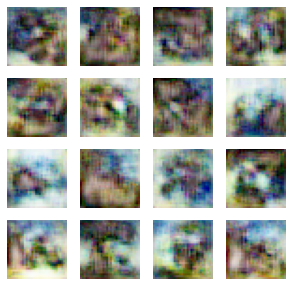

500: [discriminator loss: 0.673187, acc: 0.687500] [adversarial loss: 0.778102, acc: 0.046875]
501: [discriminator loss: 0.648895, acc: 0.765625] [adversarial loss: 0.792496, acc: 0.015625]
502: [discriminator loss: 0.660615, acc: 0.671875] [adversarial loss: 0.757894, acc: 0.156250]
503: [discriminator loss: 0.640072, acc: 0.773438] [adversarial loss: 0.946472, acc: 0.000000]
504: [discriminator loss: 0.638342, acc: 0.609375] [adversarial loss: 0.503632, acc: 1.000000]
505: [discriminator loss: 0.690145, acc: 0.500000] [adversarial loss: 1.531451, acc: 0.000000]
506: [discriminator loss: 0.799936, acc: 0.500000] [adversarial loss: 0.362070, acc: 1.000000]
507: [discriminator loss: 0.779148, acc: 0.500000] [adversarial loss: 0.759325, acc: 0.078125]
508: [discriminator loss: 0.659800, acc: 0.773438] [adversarial loss: 0.776224, acc: 0.062500]
509: [discriminator loss: 0.662234, acc: 0.679688] [adversarial loss: 0.737022, acc: 0.171875]
510: [discriminator loss: 0.654542, acc: 0.789062]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


997: [discriminator loss: 0.688518, acc: 0.500000] [adversarial loss: 0.997329, acc: 0.000000]
998: [discriminator loss: 0.679228, acc: 0.539062] [adversarial loss: 0.582885, acc: 0.921875]
999: [discriminator loss: 0.672485, acc: 0.515625] [adversarial loss: 0.821253, acc: 0.015625]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

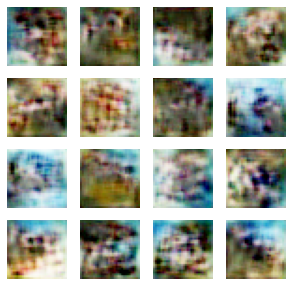

1000: [discriminator loss: 0.652227, acc: 0.601562] [adversarial loss: 0.715496, acc: 0.453125]
1001: [discriminator loss: 0.631561, acc: 0.750000] [adversarial loss: 0.914028, acc: 0.000000]
1002: [discriminator loss: 0.653637, acc: 0.601562] [adversarial loss: 0.660406, acc: 0.671875]
1003: [discriminator loss: 0.680339, acc: 0.507812] [adversarial loss: 1.270060, acc: 0.000000]
1004: [discriminator loss: 0.720641, acc: 0.507812] [adversarial loss: 0.502715, acc: 1.000000]
1005: [discriminator loss: 0.711070, acc: 0.500000] [adversarial loss: 0.876656, acc: 0.062500]
1006: [discriminator loss: 0.667253, acc: 0.562500] [adversarial loss: 0.731018, acc: 0.390625]
1007: [discriminator loss: 0.696136, acc: 0.539062] [adversarial loss: 0.870779, acc: 0.015625]
1008: [discriminator loss: 0.670573, acc: 0.578125] [adversarial loss: 0.738188, acc: 0.312500]
1009: [discriminator loss: 0.647709, acc: 0.765625] [adversarial loss: 0.813077, acc: 0.171875]
1010: [discriminator loss: 0.646020, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1498: [discriminator loss: 0.655908, acc: 0.562500] [adversarial loss: 0.881515, acc: 0.062500]
1499: [discriminator loss: 0.664031, acc: 0.625000] [adversarial loss: 0.633882, acc: 0.765625]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

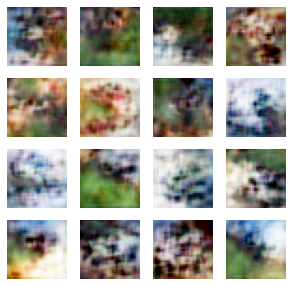

1500: [discriminator loss: 0.657778, acc: 0.546875] [adversarial loss: 1.006294, acc: 0.000000]
1501: [discriminator loss: 0.679481, acc: 0.507812] [adversarial loss: 0.476977, acc: 1.000000]
1502: [discriminator loss: 0.709861, acc: 0.507812] [adversarial loss: 1.021556, acc: 0.000000]
1503: [discriminator loss: 0.679341, acc: 0.500000] [adversarial loss: 0.535687, acc: 0.937500]
1504: [discriminator loss: 0.683068, acc: 0.515625] [adversarial loss: 0.852701, acc: 0.031250]
1505: [discriminator loss: 0.666568, acc: 0.648438] [adversarial loss: 0.708920, acc: 0.484375]
1506: [discriminator loss: 0.673994, acc: 0.562500] [adversarial loss: 0.826355, acc: 0.046875]
1507: [discriminator loss: 0.659302, acc: 0.640625] [adversarial loss: 0.697836, acc: 0.453125]
1508: [discriminator loss: 0.667034, acc: 0.625000] [adversarial loss: 0.808481, acc: 0.109375]
1509: [discriminator loss: 0.659121, acc: 0.632812] [adversarial loss: 0.803310, acc: 0.000000]
1510: [discriminator loss: 0.658398, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1999: [discriminator loss: 0.621637, acc: 0.664062] [adversarial loss: 0.807064, acc: 0.203125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


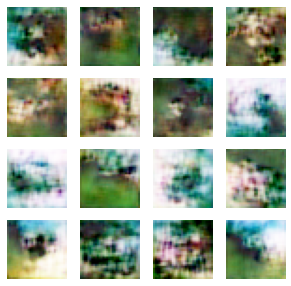

2000: [discriminator loss: 0.604595, acc: 0.703125] [adversarial loss: 1.345415, acc: 0.000000]
2001: [discriminator loss: 0.610176, acc: 0.593750] [adversarial loss: 0.374283, acc: 1.000000]
2002: [discriminator loss: 0.686957, acc: 0.507812] [adversarial loss: 1.137860, acc: 0.015625]
2003: [discriminator loss: 0.615638, acc: 0.554688] [adversarial loss: 0.327259, acc: 1.000000]
2004: [discriminator loss: 0.637613, acc: 0.507812] [adversarial loss: 0.687455, acc: 0.484375]
2005: [discriminator loss: 0.702295, acc: 0.570312] [adversarial loss: 0.305705, acc: 1.000000]
2006: [discriminator loss: 0.716267, acc: 0.453125] [adversarial loss: 0.809750, acc: 0.250000]
2007: [discriminator loss: 0.655257, acc: 0.632812] [adversarial loss: 0.467312, acc: 0.953125]
2008: [discriminator loss: 0.692299, acc: 0.570312] [adversarial loss: 1.046855, acc: 0.093750]
2009: [discriminator loss: 0.685737, acc: 0.609375] [adversarial loss: 0.456946, acc: 0.984375]
2010: [discriminator loss: 0.688097, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2498: [discriminator loss: 0.673408, acc: 0.546875] [adversarial loss: 0.893265, acc: 0.015625]
2499: [discriminator loss: 0.654099, acc: 0.601562] [adversarial loss: 0.677337, acc: 0.578125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

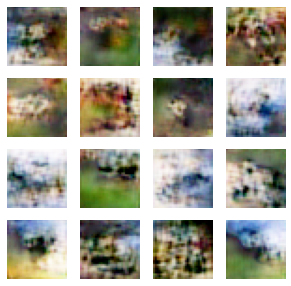

2500: [discriminator loss: 0.650755, acc: 0.679688] [adversarial loss: 0.861701, acc: 0.125000]
2501: [discriminator loss: 0.675129, acc: 0.562500] [adversarial loss: 0.619761, acc: 0.796875]
2502: [discriminator loss: 0.679884, acc: 0.546875] [adversarial loss: 0.854858, acc: 0.062500]
2503: [discriminator loss: 0.683172, acc: 0.523438] [adversarial loss: 0.654931, acc: 0.718750]
2504: [discriminator loss: 0.674296, acc: 0.531250] [adversarial loss: 0.980841, acc: 0.000000]
2505: [discriminator loss: 0.679824, acc: 0.523438] [adversarial loss: 0.597703, acc: 0.890625]
2506: [discriminator loss: 0.677782, acc: 0.531250] [adversarial loss: 1.046742, acc: 0.031250]
2507: [discriminator loss: 0.674388, acc: 0.554688] [adversarial loss: 0.641456, acc: 0.734375]
2508: [discriminator loss: 0.651452, acc: 0.578125] [adversarial loss: 0.960207, acc: 0.031250]
2509: [discriminator loss: 0.666746, acc: 0.593750] [adversarial loss: 0.554528, acc: 0.953125]
2510: [discriminator loss: 0.682473, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2998: [discriminator loss: 0.699492, acc: 0.515625] [adversarial loss: 0.867121, acc: 0.093750]
2999: [discriminator loss: 0.695478, acc: 0.531250] [adversarial loss: 0.704431, acc: 0.468750]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


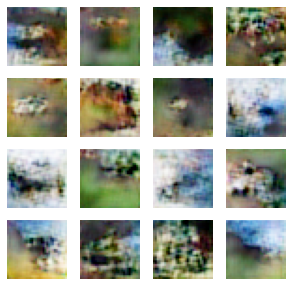

3000: [discriminator loss: 0.671166, acc: 0.601562] [adversarial loss: 0.743310, acc: 0.140625]
3001: [discriminator loss: 0.672049, acc: 0.593750] [adversarial loss: 0.746625, acc: 0.250000]
3002: [discriminator loss: 0.658973, acc: 0.671875] [adversarial loss: 0.758518, acc: 0.203125]
3003: [discriminator loss: 0.657730, acc: 0.664062] [adversarial loss: 0.769011, acc: 0.203125]
3004: [discriminator loss: 0.647758, acc: 0.703125] [adversarial loss: 0.802746, acc: 0.171875]
3005: [discriminator loss: 0.661555, acc: 0.648438] [adversarial loss: 0.724863, acc: 0.406250]
3006: [discriminator loss: 0.649203, acc: 0.726562] [adversarial loss: 0.874735, acc: 0.062500]
3007: [discriminator loss: 0.688132, acc: 0.546875] [adversarial loss: 0.512394, acc: 0.984375]
3008: [discriminator loss: 0.690104, acc: 0.492188] [adversarial loss: 1.119125, acc: 0.000000]
3009: [discriminator loss: 0.725860, acc: 0.507812] [adversarial loss: 0.446407, acc: 1.000000]
3010: [discriminator loss: 0.723675, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3498: [discriminator loss: 0.661494, acc: 0.593750] [adversarial loss: 0.693726, acc: 0.484375]
3499: [discriminator loss: 0.666368, acc: 0.554688] [adversarial loss: 0.930208, acc: 0.031250]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


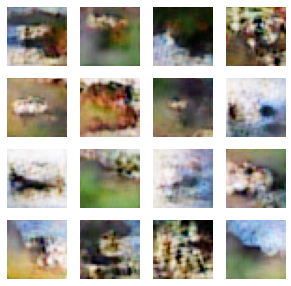

3500: [discriminator loss: 0.675497, acc: 0.562500] [adversarial loss: 0.623698, acc: 0.765625]
3501: [discriminator loss: 0.679627, acc: 0.578125] [adversarial loss: 0.989135, acc: 0.000000]
3502: [discriminator loss: 0.677435, acc: 0.554688] [adversarial loss: 0.585433, acc: 0.953125]
3503: [discriminator loss: 0.677566, acc: 0.500000] [adversarial loss: 0.866041, acc: 0.156250]
3504: [discriminator loss: 0.681483, acc: 0.562500] [adversarial loss: 0.640054, acc: 0.703125]
3505: [discriminator loss: 0.661397, acc: 0.625000] [adversarial loss: 0.837985, acc: 0.093750]
3506: [discriminator loss: 0.677145, acc: 0.531250] [adversarial loss: 0.696909, acc: 0.468750]
3507: [discriminator loss: 0.658261, acc: 0.679688] [adversarial loss: 0.871902, acc: 0.156250]
3508: [discriminator loss: 0.672427, acc: 0.539062] [adversarial loss: 0.565732, acc: 0.890625]
3509: [discriminator loss: 0.670324, acc: 0.507812] [adversarial loss: 1.050732, acc: 0.000000]
3510: [discriminator loss: 0.730521, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3998: [discriminator loss: 0.673245, acc: 0.578125] [adversarial loss: 0.980840, acc: 0.031250]
3999: [discriminator loss: 0.689284, acc: 0.546875] [adversarial loss: 0.725292, acc: 0.421875]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


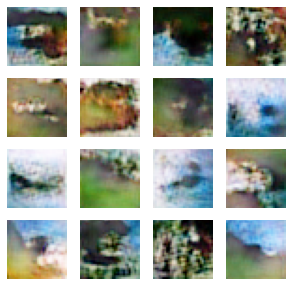

4000: [discriminator loss: 0.652048, acc: 0.617188] [adversarial loss: 0.854587, acc: 0.125000]
4001: [discriminator loss: 0.677788, acc: 0.562500] [adversarial loss: 0.628827, acc: 0.718750]
4002: [discriminator loss: 0.643611, acc: 0.679688] [adversarial loss: 0.781612, acc: 0.234375]
4003: [discriminator loss: 0.676772, acc: 0.578125] [adversarial loss: 0.433713, acc: 1.000000]
4004: [discriminator loss: 0.697039, acc: 0.531250] [adversarial loss: 0.976229, acc: 0.015625]
4005: [discriminator loss: 0.717688, acc: 0.492188] [adversarial loss: 0.509494, acc: 0.953125]
4006: [discriminator loss: 0.709509, acc: 0.500000] [adversarial loss: 1.095004, acc: 0.000000]
4007: [discriminator loss: 0.694734, acc: 0.515625] [adversarial loss: 0.606850, acc: 0.812500]
4008: [discriminator loss: 0.665746, acc: 0.554688] [adversarial loss: 0.872614, acc: 0.015625]
4009: [discriminator loss: 0.644320, acc: 0.656250] [adversarial loss: 0.563731, acc: 0.812500]
4010: [discriminator loss: 0.647188, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4498: [discriminator loss: 0.667391, acc: 0.539062] [adversarial loss: 0.718901, acc: 0.468750]
4499: [discriminator loss: 0.650976, acc: 0.593750] [adversarial loss: 0.882531, acc: 0.062500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


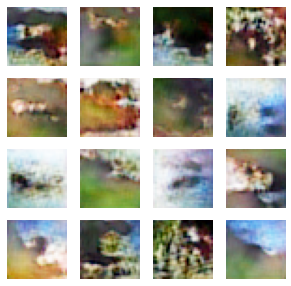

4500: [discriminator loss: 0.678084, acc: 0.546875] [adversarial loss: 0.584303, acc: 0.750000]
4501: [discriminator loss: 0.690463, acc: 0.476562] [adversarial loss: 0.919428, acc: 0.015625]
4502: [discriminator loss: 0.668540, acc: 0.617188] [adversarial loss: 0.588656, acc: 0.890625]
4503: [discriminator loss: 0.697174, acc: 0.476562] [adversarial loss: 0.898586, acc: 0.046875]
4504: [discriminator loss: 0.688007, acc: 0.546875] [adversarial loss: 0.623607, acc: 0.765625]
4505: [discriminator loss: 0.669981, acc: 0.570312] [adversarial loss: 0.985403, acc: 0.015625]
4506: [discriminator loss: 0.659086, acc: 0.609375] [adversarial loss: 0.694127, acc: 0.531250]
4507: [discriminator loss: 0.660645, acc: 0.554688] [adversarial loss: 0.986693, acc: 0.125000]
4508: [discriminator loss: 0.705937, acc: 0.554688] [adversarial loss: 0.468474, acc: 0.968750]
4509: [discriminator loss: 0.704367, acc: 0.507812] [adversarial loss: 0.944722, acc: 0.031250]
4510: [discriminator loss: 0.685888, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4998: [discriminator loss: 0.681194, acc: 0.515625] [adversarial loss: 0.725713, acc: 0.390625]
4999: [discriminator loss: 0.659672, acc: 0.625000] [adversarial loss: 1.098861, acc: 0.031250]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


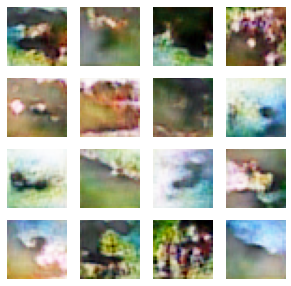

5000: [discriminator loss: 0.661361, acc: 0.585938] [adversarial loss: 0.718655, acc: 0.515625]
5001: [discriminator loss: 0.660623, acc: 0.570312] [adversarial loss: 1.034657, acc: 0.015625]
5002: [discriminator loss: 0.679656, acc: 0.601562] [adversarial loss: 0.529588, acc: 0.875000]
5003: [discriminator loss: 0.684375, acc: 0.546875] [adversarial loss: 0.879165, acc: 0.046875]
5004: [discriminator loss: 0.663590, acc: 0.640625] [adversarial loss: 0.512387, acc: 0.968750]
5005: [discriminator loss: 0.720315, acc: 0.414062] [adversarial loss: 0.981081, acc: 0.000000]
5006: [discriminator loss: 0.674092, acc: 0.562500] [adversarial loss: 0.497489, acc: 0.984375]
5007: [discriminator loss: 0.713326, acc: 0.484375] [adversarial loss: 0.836069, acc: 0.109375]
5008: [discriminator loss: 0.681825, acc: 0.585938] [adversarial loss: 0.572832, acc: 0.890625]
5009: [discriminator loss: 0.686896, acc: 0.500000] [adversarial loss: 0.911146, acc: 0.000000]
5010: [discriminator loss: 0.656901, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5498: [discriminator loss: 0.660707, acc: 0.578125] [adversarial loss: 0.641506, acc: 0.671875]
5499: [discriminator loss: 0.666716, acc: 0.617188] [adversarial loss: 0.807056, acc: 0.234375]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


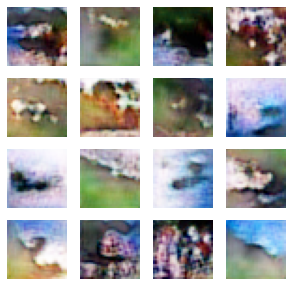

5500: [discriminator loss: 0.677883, acc: 0.593750] [adversarial loss: 0.743695, acc: 0.437500]
5501: [discriminator loss: 0.661008, acc: 0.632812] [adversarial loss: 0.801899, acc: 0.281250]
5502: [discriminator loss: 0.672077, acc: 0.554688] [adversarial loss: 0.578602, acc: 0.843750]
5503: [discriminator loss: 0.695938, acc: 0.507812] [adversarial loss: 0.720636, acc: 0.437500]
5504: [discriminator loss: 0.673926, acc: 0.570312] [adversarial loss: 0.682862, acc: 0.500000]
5505: [discriminator loss: 0.661956, acc: 0.578125] [adversarial loss: 0.844468, acc: 0.171875]
5506: [discriminator loss: 0.648785, acc: 0.679688] [adversarial loss: 0.580467, acc: 0.765625]
5507: [discriminator loss: 0.688299, acc: 0.585938] [adversarial loss: 1.157859, acc: 0.000000]
5508: [discriminator loss: 0.727258, acc: 0.515625] [adversarial loss: 0.429866, acc: 0.984375]
5509: [discriminator loss: 0.731120, acc: 0.500000] [adversarial loss: 1.056744, acc: 0.000000]
5510: [discriminator loss: 0.696525, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5998: [discriminator loss: 0.678881, acc: 0.570312] [adversarial loss: 0.661334, acc: 0.625000]
5999: [discriminator loss: 0.705973, acc: 0.460938] [adversarial loss: 0.809688, acc: 0.078125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


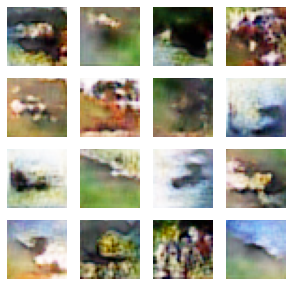

6000: [discriminator loss: 0.670036, acc: 0.570312] [adversarial loss: 0.624918, acc: 0.718750]
6001: [discriminator loss: 0.675999, acc: 0.539062] [adversarial loss: 1.129318, acc: 0.000000]
6002: [discriminator loss: 0.713297, acc: 0.500000] [adversarial loss: 0.481602, acc: 1.000000]
6003: [discriminator loss: 0.720914, acc: 0.500000] [adversarial loss: 1.014571, acc: 0.000000]
6004: [discriminator loss: 0.687515, acc: 0.531250] [adversarial loss: 0.601622, acc: 0.796875]
6005: [discriminator loss: 0.674987, acc: 0.570312] [adversarial loss: 0.894979, acc: 0.062500]
6006: [discriminator loss: 0.713490, acc: 0.500000] [adversarial loss: 0.622453, acc: 0.765625]
6007: [discriminator loss: 0.690569, acc: 0.523438] [adversarial loss: 0.908545, acc: 0.046875]
6008: [discriminator loss: 0.687874, acc: 0.570312] [adversarial loss: 0.624318, acc: 0.734375]
6009: [discriminator loss: 0.683381, acc: 0.539062] [adversarial loss: 0.803073, acc: 0.171875]
6010: [discriminator loss: 0.693055, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6497: [discriminator loss: 0.749281, acc: 0.500000] [adversarial loss: 1.005185, acc: 0.046875]
6498: [discriminator loss: 0.703903, acc: 0.531250] [adversarial loss: 0.591159, acc: 0.781250]
6499: [discriminator loss: 0.709107, acc: 0.507812] [adversarial loss: 0.959654, acc: 0.078125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


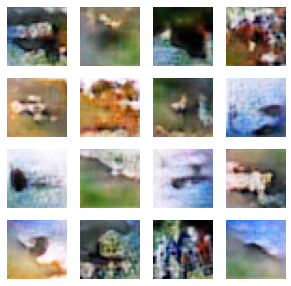

6500: [discriminator loss: 0.698691, acc: 0.523438] [adversarial loss: 0.628829, acc: 0.718750]
6501: [discriminator loss: 0.686901, acc: 0.523438] [adversarial loss: 0.832049, acc: 0.187500]
6502: [discriminator loss: 0.670426, acc: 0.562500] [adversarial loss: 0.664867, acc: 0.625000]
6503: [discriminator loss: 0.675201, acc: 0.625000] [adversarial loss: 0.888670, acc: 0.109375]
6504: [discriminator loss: 0.659634, acc: 0.601562] [adversarial loss: 0.517279, acc: 0.875000]
6505: [discriminator loss: 0.690073, acc: 0.546875] [adversarial loss: 1.014754, acc: 0.015625]
6506: [discriminator loss: 0.680931, acc: 0.531250] [adversarial loss: 0.474809, acc: 0.968750]
6507: [discriminator loss: 0.720940, acc: 0.507812] [adversarial loss: 1.051315, acc: 0.000000]
6508: [discriminator loss: 0.669552, acc: 0.539062] [adversarial loss: 0.567360, acc: 0.921875]
6509: [discriminator loss: 0.687943, acc: 0.507812] [adversarial loss: 0.780606, acc: 0.187500]
6510: [discriminator loss: 0.648612, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

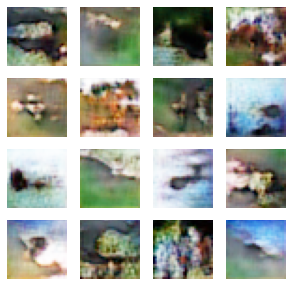

7000: [discriminator loss: 0.720635, acc: 0.460938] [adversarial loss: 0.747149, acc: 0.375000]
7001: [discriminator loss: 0.711120, acc: 0.445312] [adversarial loss: 0.865782, acc: 0.140625]
7002: [discriminator loss: 0.698386, acc: 0.554688] [adversarial loss: 0.582046, acc: 0.921875]
7003: [discriminator loss: 0.687839, acc: 0.531250] [adversarial loss: 0.937402, acc: 0.015625]
7004: [discriminator loss: 0.687365, acc: 0.523438] [adversarial loss: 0.608169, acc: 0.843750]
7005: [discriminator loss: 0.674774, acc: 0.523438] [adversarial loss: 0.978737, acc: 0.015625]
7006: [discriminator loss: 0.696715, acc: 0.562500] [adversarial loss: 0.488776, acc: 0.984375]
7007: [discriminator loss: 0.710133, acc: 0.500000] [adversarial loss: 1.088572, acc: 0.031250]
7008: [discriminator loss: 0.713215, acc: 0.507812] [adversarial loss: 0.524912, acc: 0.984375]
7009: [discriminator loss: 0.675574, acc: 0.531250] [adversarial loss: 0.837386, acc: 0.171875]
7010: [discriminator loss: 0.738823, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7498: [discriminator loss: 0.671885, acc: 0.601562] [adversarial loss: 0.806341, acc: 0.156250]
7499: [discriminator loss: 0.674661, acc: 0.609375] [adversarial loss: 0.678909, acc: 0.515625]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


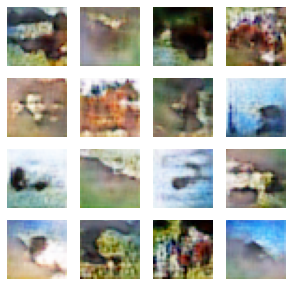

7500: [discriminator loss: 0.667931, acc: 0.601562] [adversarial loss: 0.984335, acc: 0.093750]
7501: [discriminator loss: 0.651542, acc: 0.593750] [adversarial loss: 0.492729, acc: 0.968750]
7502: [discriminator loss: 0.717000, acc: 0.531250] [adversarial loss: 1.167789, acc: 0.031250]
7503: [discriminator loss: 0.720902, acc: 0.539062] [adversarial loss: 0.524679, acc: 0.953125]
7504: [discriminator loss: 0.695056, acc: 0.492188] [adversarial loss: 0.894423, acc: 0.156250]
7505: [discriminator loss: 0.671749, acc: 0.609375] [adversarial loss: 0.571336, acc: 0.843750]
7506: [discriminator loss: 0.705754, acc: 0.453125] [adversarial loss: 0.752824, acc: 0.296875]
7507: [discriminator loss: 0.678404, acc: 0.601562] [adversarial loss: 0.637523, acc: 0.734375]
7508: [discriminator loss: 0.700253, acc: 0.523438] [adversarial loss: 0.795653, acc: 0.296875]
7509: [discriminator loss: 0.689935, acc: 0.523438] [adversarial loss: 0.689190, acc: 0.546875]
7510: [discriminator loss: 0.662187, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7998: [discriminator loss: 0.665843, acc: 0.546875] [adversarial loss: 0.499986, acc: 0.921875]
7999: [discriminator loss: 0.692634, acc: 0.476562] [adversarial loss: 0.888063, acc: 0.062500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


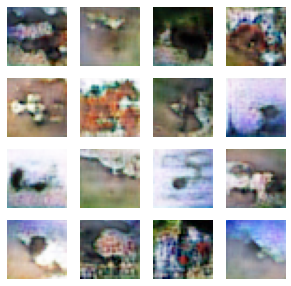

8000: [discriminator loss: 0.717443, acc: 0.539062] [adversarial loss: 0.412219, acc: 1.000000]
8001: [discriminator loss: 0.709922, acc: 0.460938] [adversarial loss: 0.869457, acc: 0.062500]
8002: [discriminator loss: 0.685069, acc: 0.531250] [adversarial loss: 0.490351, acc: 0.984375]
8003: [discriminator loss: 0.685743, acc: 0.492188] [adversarial loss: 0.954802, acc: 0.062500]
8004: [discriminator loss: 0.697430, acc: 0.492188] [adversarial loss: 0.601266, acc: 0.828125]
8005: [discriminator loss: 0.690961, acc: 0.468750] [adversarial loss: 0.857219, acc: 0.062500]
8006: [discriminator loss: 0.656748, acc: 0.593750] [adversarial loss: 0.770490, acc: 0.312500]
8007: [discriminator loss: 0.661421, acc: 0.570312] [adversarial loss: 0.954340, acc: 0.046875]
8008: [discriminator loss: 0.646309, acc: 0.640625] [adversarial loss: 0.675459, acc: 0.562500]
8009: [discriminator loss: 0.640560, acc: 0.671875] [adversarial loss: 0.862907, acc: 0.109375]
8010: [discriminator loss: 0.621927, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8498: [discriminator loss: 0.720239, acc: 0.515625] [adversarial loss: 0.580168, acc: 0.906250]
8499: [discriminator loss: 0.715187, acc: 0.515625] [adversarial loss: 0.914713, acc: 0.015625]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


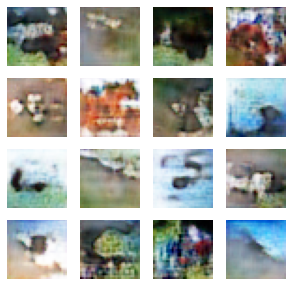

8500: [discriminator loss: 0.700895, acc: 0.515625] [adversarial loss: 0.576319, acc: 0.937500]
8501: [discriminator loss: 0.708795, acc: 0.507812] [adversarial loss: 0.982407, acc: 0.015625]
8502: [discriminator loss: 0.714308, acc: 0.554688] [adversarial loss: 0.516701, acc: 0.984375]
8503: [discriminator loss: 0.702490, acc: 0.500000] [adversarial loss: 0.920967, acc: 0.031250]
8504: [discriminator loss: 0.671397, acc: 0.625000] [adversarial loss: 0.631332, acc: 0.687500]
8505: [discriminator loss: 0.703413, acc: 0.468750] [adversarial loss: 0.934928, acc: 0.046875]
8506: [discriminator loss: 0.678723, acc: 0.593750] [adversarial loss: 0.570524, acc: 0.812500]
8507: [discriminator loss: 0.706835, acc: 0.515625] [adversarial loss: 0.912316, acc: 0.031250]
8508: [discriminator loss: 0.703034, acc: 0.507812] [adversarial loss: 0.542683, acc: 0.921875]
8509: [discriminator loss: 0.709193, acc: 0.468750] [adversarial loss: 0.857367, acc: 0.031250]
8510: [discriminator loss: 0.677805, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8998: [discriminator loss: 0.673124, acc: 0.625000] [adversarial loss: 0.922116, acc: 0.015625]
8999: [discriminator loss: 0.724197, acc: 0.507812] [adversarial loss: 0.393841, acc: 1.000000]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


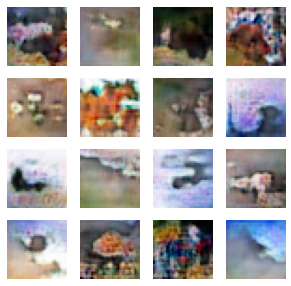

9000: [discriminator loss: 0.754498, acc: 0.492188] [adversarial loss: 0.933834, acc: 0.031250]
9001: [discriminator loss: 0.727458, acc: 0.492188] [adversarial loss: 0.611313, acc: 0.750000]
9002: [discriminator loss: 0.672482, acc: 0.593750] [adversarial loss: 0.945131, acc: 0.062500]
9003: [discriminator loss: 0.698490, acc: 0.562500] [adversarial loss: 0.571986, acc: 0.906250]
9004: [discriminator loss: 0.696180, acc: 0.500000] [adversarial loss: 1.022721, acc: 0.015625]
9005: [discriminator loss: 0.696248, acc: 0.539062] [adversarial loss: 0.613182, acc: 0.843750]
9006: [discriminator loss: 0.689784, acc: 0.539062] [adversarial loss: 0.877221, acc: 0.125000]
9007: [discriminator loss: 0.686257, acc: 0.585938] [adversarial loss: 0.711709, acc: 0.421875]
9008: [discriminator loss: 0.654782, acc: 0.664062] [adversarial loss: 0.861055, acc: 0.109375]
9009: [discriminator loss: 0.676736, acc: 0.601562] [adversarial loss: 0.734071, acc: 0.421875]
9010: [discriminator loss: 0.667604, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9497: [discriminator loss: 0.692664, acc: 0.601562] [adversarial loss: 0.590805, acc: 0.828125]
9498: [discriminator loss: 0.695964, acc: 0.492188] [adversarial loss: 0.934634, acc: 0.031250]
9499: [discriminator loss: 0.707195, acc: 0.507812] [adversarial loss: 0.487619, acc: 0.968750]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


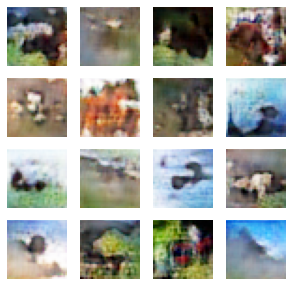

9500: [discriminator loss: 0.736237, acc: 0.453125] [adversarial loss: 0.985913, acc: 0.000000]
9501: [discriminator loss: 0.731623, acc: 0.500000] [adversarial loss: 0.548915, acc: 0.843750]
9502: [discriminator loss: 0.721194, acc: 0.468750] [adversarial loss: 0.847062, acc: 0.078125]
9503: [discriminator loss: 0.714113, acc: 0.523438] [adversarial loss: 0.654021, acc: 0.718750]
9504: [discriminator loss: 0.674776, acc: 0.562500] [adversarial loss: 0.781425, acc: 0.203125]
9505: [discriminator loss: 0.657899, acc: 0.664062] [adversarial loss: 0.691846, acc: 0.531250]
9506: [discriminator loss: 0.691849, acc: 0.515625] [adversarial loss: 0.790089, acc: 0.187500]
9507: [discriminator loss: 0.654327, acc: 0.656250] [adversarial loss: 0.755668, acc: 0.390625]
9508: [discriminator loss: 0.735854, acc: 0.507812] [adversarial loss: 0.678453, acc: 0.531250]
9509: [discriminator loss: 0.684557, acc: 0.531250] [adversarial loss: 0.856045, acc: 0.062500]
9510: [discriminator loss: 0.701185, acc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9998: [discriminator loss: 0.678366, acc: 0.585938] [adversarial loss: 0.909093, acc: 0.015625]
9999: [discriminator loss: 0.673537, acc: 0.562500] [adversarial loss: 0.670973, acc: 0.609375]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


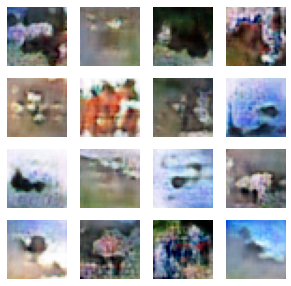

10000: [discriminator loss: 0.668285, acc: 0.585938] [adversarial loss: 0.853540, acc: 0.156250]
10001: [discriminator loss: 0.664847, acc: 0.648438] [adversarial loss: 0.705114, acc: 0.500000]
10002: [discriminator loss: 0.690213, acc: 0.507812] [adversarial loss: 0.976442, acc: 0.046875]
10003: [discriminator loss: 0.691948, acc: 0.625000] [adversarial loss: 0.424714, acc: 0.984375]
10004: [discriminator loss: 0.765501, acc: 0.468750] [adversarial loss: 1.159228, acc: 0.015625]
10005: [discriminator loss: 0.800501, acc: 0.515625] [adversarial loss: 0.456730, acc: 0.953125]
10006: [discriminator loss: 0.735649, acc: 0.492188] [adversarial loss: 0.838163, acc: 0.031250]
10007: [discriminator loss: 0.704280, acc: 0.468750] [adversarial loss: 0.695876, acc: 0.546875]
10008: [discriminator loss: 0.682642, acc: 0.562500] [adversarial loss: 0.836926, acc: 0.140625]
10009: [discriminator loss: 0.728823, acc: 0.515625] [adversarial loss: 0.607742, acc: 0.750000]
10010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10498: [discriminator loss: 0.667909, acc: 0.578125] [adversarial loss: 1.203361, acc: 0.031250]
10499: [discriminator loss: 0.713401, acc: 0.523438] [adversarial loss: 0.492238, acc: 0.953125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


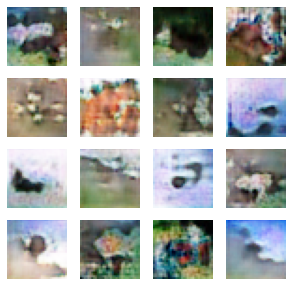

10500: [discriminator loss: 0.710318, acc: 0.523438] [adversarial loss: 0.874051, acc: 0.125000]
10501: [discriminator loss: 0.674181, acc: 0.578125] [adversarial loss: 0.501585, acc: 1.000000]
10502: [discriminator loss: 0.698552, acc: 0.500000] [adversarial loss: 0.790271, acc: 0.281250]
10503: [discriminator loss: 0.699884, acc: 0.523438] [adversarial loss: 0.501776, acc: 0.984375]
10504: [discriminator loss: 0.692767, acc: 0.531250] [adversarial loss: 0.864742, acc: 0.125000]
10505: [discriminator loss: 0.681678, acc: 0.539062] [adversarial loss: 0.621796, acc: 0.703125]
10506: [discriminator loss: 0.687043, acc: 0.539062] [adversarial loss: 1.054639, acc: 0.031250]
10507: [discriminator loss: 0.678910, acc: 0.531250] [adversarial loss: 0.644474, acc: 0.687500]
10508: [discriminator loss: 0.670025, acc: 0.539062] [adversarial loss: 1.088565, acc: 0.000000]
10509: [discriminator loss: 0.672773, acc: 0.546875] [adversarial loss: 0.637102, acc: 0.656250]
10510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10998: [discriminator loss: 0.658689, acc: 0.562500] [adversarial loss: 0.483934, acc: 0.906250]
10999: [discriminator loss: 0.694292, acc: 0.523438] [adversarial loss: 1.195854, acc: 0.078125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


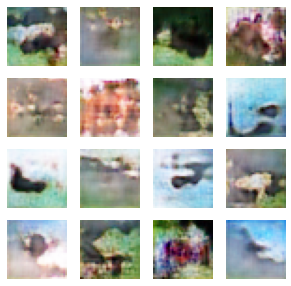

11000: [discriminator loss: 0.672407, acc: 0.617188] [adversarial loss: 0.530875, acc: 0.859375]
11001: [discriminator loss: 0.672838, acc: 0.554688] [adversarial loss: 0.906555, acc: 0.218750]
11002: [discriminator loss: 0.671602, acc: 0.578125] [adversarial loss: 0.528597, acc: 0.953125]
11003: [discriminator loss: 0.677163, acc: 0.515625] [adversarial loss: 1.012918, acc: 0.078125]
11004: [discriminator loss: 0.686290, acc: 0.554688] [adversarial loss: 0.523912, acc: 0.953125]
11005: [discriminator loss: 0.669859, acc: 0.562500] [adversarial loss: 0.950267, acc: 0.125000]
11006: [discriminator loss: 0.655600, acc: 0.671875] [adversarial loss: 0.433622, acc: 1.000000]
11007: [discriminator loss: 0.703075, acc: 0.531250] [adversarial loss: 0.925543, acc: 0.171875]
11008: [discriminator loss: 0.712118, acc: 0.554688] [adversarial loss: 0.535259, acc: 0.843750]
11009: [discriminator loss: 0.711661, acc: 0.539062] [adversarial loss: 1.014013, acc: 0.062500]
11010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11498: [discriminator loss: 0.665460, acc: 0.578125] [adversarial loss: 0.898492, acc: 0.078125]
11499: [discriminator loss: 0.713740, acc: 0.546875] [adversarial loss: 0.456178, acc: 1.000000]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


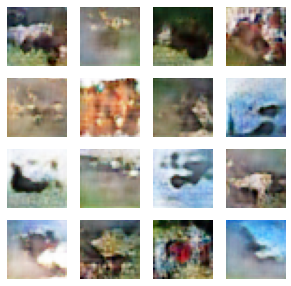

11500: [discriminator loss: 0.731627, acc: 0.492188] [adversarial loss: 1.047597, acc: 0.015625]
11501: [discriminator loss: 0.763165, acc: 0.507812] [adversarial loss: 0.463042, acc: 0.984375]
11502: [discriminator loss: 0.723973, acc: 0.539062] [adversarial loss: 0.931769, acc: 0.109375]
11503: [discriminator loss: 0.717678, acc: 0.507812] [adversarial loss: 0.593312, acc: 0.765625]
11504: [discriminator loss: 0.704241, acc: 0.515625] [adversarial loss: 0.988007, acc: 0.000000]
11505: [discriminator loss: 0.694762, acc: 0.507812] [adversarial loss: 0.628466, acc: 0.734375]
11506: [discriminator loss: 0.685595, acc: 0.523438] [adversarial loss: 0.905870, acc: 0.015625]
11507: [discriminator loss: 0.660583, acc: 0.609375] [adversarial loss: 0.544757, acc: 0.796875]
11508: [discriminator loss: 0.680558, acc: 0.562500] [adversarial loss: 1.038366, acc: 0.062500]
11509: [discriminator loss: 0.737278, acc: 0.515625] [adversarial loss: 0.421349, acc: 0.968750]
11510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11998: [discriminator loss: 0.642575, acc: 0.679688] [adversarial loss: 0.881887, acc: 0.187500]
11999: [discriminator loss: 0.694448, acc: 0.554688] [adversarial loss: 0.751546, acc: 0.343750]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


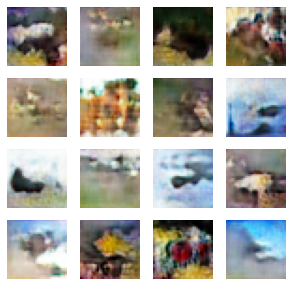

12000: [discriminator loss: 0.693088, acc: 0.523438] [adversarial loss: 0.789239, acc: 0.250000]
12001: [discriminator loss: 0.691575, acc: 0.578125] [adversarial loss: 0.636753, acc: 0.671875]
12002: [discriminator loss: 0.684975, acc: 0.554688] [adversarial loss: 0.931008, acc: 0.093750]
12003: [discriminator loss: 0.708373, acc: 0.554688] [adversarial loss: 0.443826, acc: 0.953125]
12004: [discriminator loss: 0.736292, acc: 0.507812] [adversarial loss: 1.065898, acc: 0.015625]
12005: [discriminator loss: 0.702568, acc: 0.515625] [adversarial loss: 0.540678, acc: 0.828125]
12006: [discriminator loss: 0.730580, acc: 0.531250] [adversarial loss: 1.068184, acc: 0.031250]
12007: [discriminator loss: 0.673987, acc: 0.500000] [adversarial loss: 0.490474, acc: 0.890625]
12008: [discriminator loss: 0.706795, acc: 0.523438] [adversarial loss: 0.893275, acc: 0.078125]
12009: [discriminator loss: 0.660821, acc: 0.640625] [adversarial loss: 0.622421, acc: 0.765625]
12010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12498: [discriminator loss: 0.726336, acc: 0.468750] [adversarial loss: 1.072187, acc: 0.015625]
12499: [discriminator loss: 0.721702, acc: 0.523438] [adversarial loss: 0.515612, acc: 0.921875]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


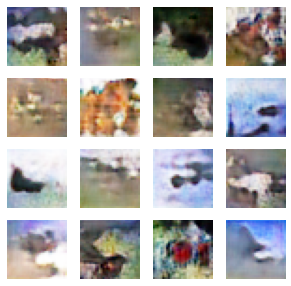

12500: [discriminator loss: 0.716758, acc: 0.476562] [adversarial loss: 1.002622, acc: 0.062500]
12501: [discriminator loss: 0.701931, acc: 0.554688] [adversarial loss: 0.477056, acc: 0.984375]
12502: [discriminator loss: 0.714434, acc: 0.492188] [adversarial loss: 0.893828, acc: 0.078125]
12503: [discriminator loss: 0.686969, acc: 0.523438] [adversarial loss: 0.632788, acc: 0.796875]
12504: [discriminator loss: 0.692703, acc: 0.546875] [adversarial loss: 0.958818, acc: 0.125000]
12505: [discriminator loss: 0.708216, acc: 0.468750] [adversarial loss: 0.510084, acc: 0.921875]
12506: [discriminator loss: 0.699823, acc: 0.484375] [adversarial loss: 0.971913, acc: 0.046875]
12507: [discriminator loss: 0.705522, acc: 0.539062] [adversarial loss: 0.512714, acc: 0.953125]
12508: [discriminator loss: 0.704516, acc: 0.515625] [adversarial loss: 0.875784, acc: 0.078125]
12509: [discriminator loss: 0.700605, acc: 0.562500] [adversarial loss: 0.560954, acc: 0.875000]
12510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12998: [discriminator loss: 0.746064, acc: 0.539062] [adversarial loss: 0.396318, acc: 1.000000]
12999: [discriminator loss: 0.718833, acc: 0.507812] [adversarial loss: 0.974678, acc: 0.031250]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


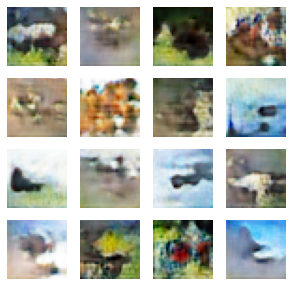

13000: [discriminator loss: 0.730025, acc: 0.546875] [adversarial loss: 0.567717, acc: 0.875000]
13001: [discriminator loss: 0.710181, acc: 0.500000] [adversarial loss: 0.843349, acc: 0.125000]
13002: [discriminator loss: 0.702615, acc: 0.523438] [adversarial loss: 0.660559, acc: 0.640625]
13003: [discriminator loss: 0.723154, acc: 0.468750] [adversarial loss: 0.693490, acc: 0.500000]
13004: [discriminator loss: 0.696182, acc: 0.500000] [adversarial loss: 0.770029, acc: 0.250000]
13005: [discriminator loss: 0.686836, acc: 0.500000] [adversarial loss: 0.674260, acc: 0.531250]
13006: [discriminator loss: 0.685437, acc: 0.562500] [adversarial loss: 0.875668, acc: 0.109375]
13007: [discriminator loss: 0.665123, acc: 0.562500] [adversarial loss: 0.624537, acc: 0.734375]
13008: [discriminator loss: 0.649666, acc: 0.648438] [adversarial loss: 1.007339, acc: 0.031250]
13009: [discriminator loss: 0.707352, acc: 0.507812] [adversarial loss: 0.442220, acc: 0.953125]
13010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


13498: [discriminator loss: 0.692630, acc: 0.554688] [adversarial loss: 0.595427, acc: 0.828125]
13499: [discriminator loss: 0.702425, acc: 0.515625] [adversarial loss: 0.815461, acc: 0.171875]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


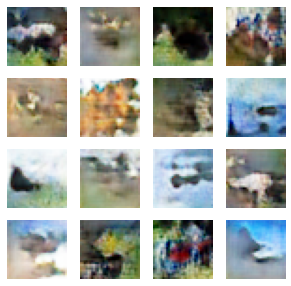

13500: [discriminator loss: 0.706546, acc: 0.445312] [adversarial loss: 0.535635, acc: 0.906250]
13501: [discriminator loss: 0.717133, acc: 0.492188] [adversarial loss: 0.982228, acc: 0.031250]
13502: [discriminator loss: 0.732819, acc: 0.507812] [adversarial loss: 0.547212, acc: 0.937500]
13503: [discriminator loss: 0.720013, acc: 0.515625] [adversarial loss: 1.031162, acc: 0.000000]
13504: [discriminator loss: 0.721566, acc: 0.507812] [adversarial loss: 0.525698, acc: 0.953125]
13505: [discriminator loss: 0.704327, acc: 0.507812] [adversarial loss: 0.960536, acc: 0.031250]
13506: [discriminator loss: 0.691175, acc: 0.546875] [adversarial loss: 0.664638, acc: 0.703125]
13507: [discriminator loss: 0.685286, acc: 0.507812] [adversarial loss: 0.864456, acc: 0.046875]
13508: [discriminator loss: 0.683852, acc: 0.554688] [adversarial loss: 0.611859, acc: 0.687500]
13509: [discriminator loss: 0.724574, acc: 0.468750] [adversarial loss: 0.920623, acc: 0.046875]
13510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


13998: [discriminator loss: 0.677267, acc: 0.546875] [adversarial loss: 0.877442, acc: 0.093750]
13999: [discriminator loss: 0.685017, acc: 0.578125] [adversarial loss: 0.616609, acc: 0.765625]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


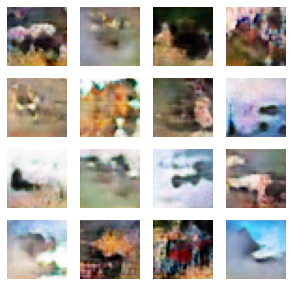

14000: [discriminator loss: 0.700220, acc: 0.515625] [adversarial loss: 0.997590, acc: 0.078125]
14001: [discriminator loss: 0.695879, acc: 0.515625] [adversarial loss: 0.598051, acc: 0.781250]
14002: [discriminator loss: 0.714357, acc: 0.515625] [adversarial loss: 1.251084, acc: 0.000000]
14003: [discriminator loss: 0.734794, acc: 0.500000] [adversarial loss: 0.493713, acc: 0.968750]
14004: [discriminator loss: 0.709119, acc: 0.523438] [adversarial loss: 0.965286, acc: 0.140625]
14005: [discriminator loss: 0.694240, acc: 0.523438] [adversarial loss: 0.535192, acc: 0.843750]
14006: [discriminator loss: 0.666738, acc: 0.570312] [adversarial loss: 0.898706, acc: 0.109375]
14007: [discriminator loss: 0.664983, acc: 0.632812] [adversarial loss: 0.520692, acc: 0.937500]
14008: [discriminator loss: 0.675691, acc: 0.554688] [adversarial loss: 0.774333, acc: 0.296875]
14009: [discriminator loss: 0.690493, acc: 0.562500] [adversarial loss: 0.515655, acc: 0.968750]
14010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


14498: [discriminator loss: 0.704326, acc: 0.515625] [adversarial loss: 0.663693, acc: 0.625000]
14499: [discriminator loss: 0.700297, acc: 0.539062] [adversarial loss: 0.786784, acc: 0.156250]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


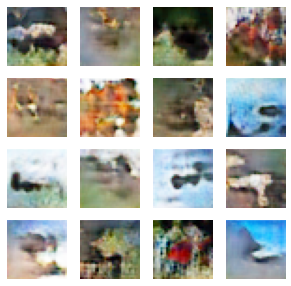

14500: [discriminator loss: 0.702496, acc: 0.539062] [adversarial loss: 0.635510, acc: 0.734375]
14501: [discriminator loss: 0.687489, acc: 0.562500] [adversarial loss: 0.864845, acc: 0.062500]
14502: [discriminator loss: 0.664042, acc: 0.601562] [adversarial loss: 0.587726, acc: 0.828125]
14503: [discriminator loss: 0.695612, acc: 0.515625] [adversarial loss: 0.861888, acc: 0.171875]
14504: [discriminator loss: 0.703144, acc: 0.500000] [adversarial loss: 0.497506, acc: 0.984375]
14505: [discriminator loss: 0.711853, acc: 0.515625] [adversarial loss: 1.096426, acc: 0.015625]
14506: [discriminator loss: 0.717713, acc: 0.523438] [adversarial loss: 0.512438, acc: 0.937500]
14507: [discriminator loss: 0.727144, acc: 0.492188] [adversarial loss: 0.937895, acc: 0.093750]
14508: [discriminator loss: 0.704541, acc: 0.523438] [adversarial loss: 0.575237, acc: 0.843750]
14509: [discriminator loss: 0.711635, acc: 0.429688] [adversarial loss: 0.908987, acc: 0.078125]
14510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


14998: [discriminator loss: 0.714084, acc: 0.492188] [adversarial loss: 0.771714, acc: 0.296875]
14999: [discriminator loss: 0.705156, acc: 0.500000] [adversarial loss: 0.659463, acc: 0.593750]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


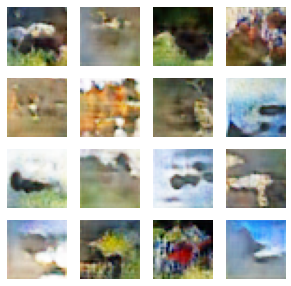

15000: [discriminator loss: 0.713272, acc: 0.468750] [adversarial loss: 0.815802, acc: 0.171875]
15001: [discriminator loss: 0.689346, acc: 0.546875] [adversarial loss: 0.737903, acc: 0.312500]
15002: [discriminator loss: 0.670962, acc: 0.593750] [adversarial loss: 0.732447, acc: 0.406250]
15003: [discriminator loss: 0.683269, acc: 0.617188] [adversarial loss: 0.917150, acc: 0.109375]
15004: [discriminator loss: 0.687023, acc: 0.562500] [adversarial loss: 0.526422, acc: 0.796875]
15005: [discriminator loss: 0.694429, acc: 0.601562] [adversarial loss: 1.085704, acc: 0.000000]
15006: [discriminator loss: 0.707386, acc: 0.546875] [adversarial loss: 0.493174, acc: 0.984375]
15007: [discriminator loss: 0.720073, acc: 0.476562] [adversarial loss: 0.896257, acc: 0.093750]
15008: [discriminator loss: 0.714246, acc: 0.531250] [adversarial loss: 0.553656, acc: 0.906250]
15009: [discriminator loss: 0.679859, acc: 0.554688] [adversarial loss: 0.829842, acc: 0.093750]
15010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


15498: [discriminator loss: 0.750020, acc: 0.507812] [adversarial loss: 0.477218, acc: 0.968750]
15499: [discriminator loss: 0.721743, acc: 0.507812] [adversarial loss: 0.842642, acc: 0.187500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


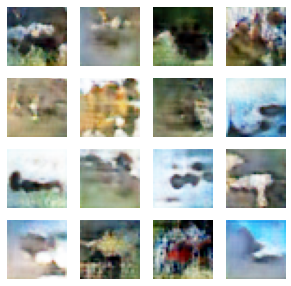

15500: [discriminator loss: 0.712715, acc: 0.531250] [adversarial loss: 0.675450, acc: 0.625000]
15501: [discriminator loss: 0.694662, acc: 0.492188] [adversarial loss: 0.918558, acc: 0.078125]
15502: [discriminator loss: 0.695326, acc: 0.539062] [adversarial loss: 0.605911, acc: 0.750000]
15503: [discriminator loss: 0.690368, acc: 0.546875] [adversarial loss: 0.921983, acc: 0.125000]
15504: [discriminator loss: 0.673399, acc: 0.570312] [adversarial loss: 0.511091, acc: 0.890625]
15505: [discriminator loss: 0.649337, acc: 0.562500] [adversarial loss: 1.017942, acc: 0.046875]
15506: [discriminator loss: 0.670244, acc: 0.617188] [adversarial loss: 0.360396, acc: 0.984375]
15507: [discriminator loss: 0.703838, acc: 0.515625] [adversarial loss: 0.958688, acc: 0.171875]
15508: [discriminator loss: 0.701100, acc: 0.562500] [adversarial loss: 0.426188, acc: 1.000000]
15509: [discriminator loss: 0.697312, acc: 0.515625] [adversarial loss: 0.829803, acc: 0.265625]
15510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


15998: [discriminator loss: 0.667159, acc: 0.632812] [adversarial loss: 0.626609, acc: 0.687500]
15999: [discriminator loss: 0.662310, acc: 0.585938] [adversarial loss: 1.024427, acc: 0.015625]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


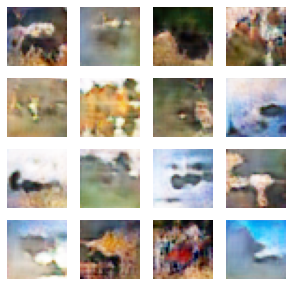

16000: [discriminator loss: 0.687123, acc: 0.570312] [adversarial loss: 0.540747, acc: 0.859375]
16001: [discriminator loss: 0.703253, acc: 0.531250] [adversarial loss: 1.359835, acc: 0.031250]
16002: [discriminator loss: 0.759816, acc: 0.515625] [adversarial loss: 0.370930, acc: 0.984375]
16003: [discriminator loss: 0.774832, acc: 0.507812] [adversarial loss: 0.855662, acc: 0.218750]
16004: [discriminator loss: 0.692970, acc: 0.546875] [adversarial loss: 0.512156, acc: 0.890625]
16005: [discriminator loss: 0.696837, acc: 0.507812] [adversarial loss: 0.806452, acc: 0.281250]
16006: [discriminator loss: 0.667696, acc: 0.570312] [adversarial loss: 0.605324, acc: 0.750000]
16007: [discriminator loss: 0.696077, acc: 0.515625] [adversarial loss: 0.725367, acc: 0.406250]
16008: [discriminator loss: 0.714582, acc: 0.500000] [adversarial loss: 0.634068, acc: 0.703125]
16009: [discriminator loss: 0.708767, acc: 0.453125] [adversarial loss: 1.008422, acc: 0.031250]
16010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


16498: [discriminator loss: 0.688517, acc: 0.546875] [adversarial loss: 0.538086, acc: 0.953125]
16499: [discriminator loss: 0.693065, acc: 0.523438] [adversarial loss: 1.016271, acc: 0.000000]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


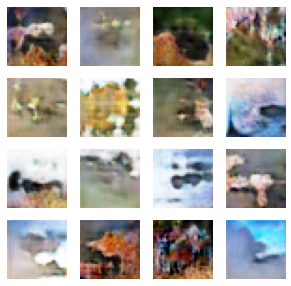

16500: [discriminator loss: 0.715678, acc: 0.562500] [adversarial loss: 0.514141, acc: 0.906250]
16501: [discriminator loss: 0.707482, acc: 0.531250] [adversarial loss: 1.061894, acc: 0.062500]
16502: [discriminator loss: 0.715474, acc: 0.515625] [adversarial loss: 0.470966, acc: 0.921875]
16503: [discriminator loss: 0.740386, acc: 0.492188] [adversarial loss: 0.931677, acc: 0.093750]
16504: [discriminator loss: 0.719247, acc: 0.554688] [adversarial loss: 0.526848, acc: 0.937500]
16505: [discriminator loss: 0.690470, acc: 0.468750] [adversarial loss: 0.765406, acc: 0.312500]
16506: [discriminator loss: 0.735698, acc: 0.460938] [adversarial loss: 0.612265, acc: 0.796875]
16507: [discriminator loss: 0.693243, acc: 0.531250] [adversarial loss: 0.783465, acc: 0.281250]
16508: [discriminator loss: 0.651129, acc: 0.593750] [adversarial loss: 0.673897, acc: 0.562500]
16509: [discriminator loss: 0.654785, acc: 0.656250] [adversarial loss: 0.789762, acc: 0.218750]
16510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


16998: [discriminator loss: 0.707661, acc: 0.562500] [adversarial loss: 0.885422, acc: 0.140625]
16999: [discriminator loss: 0.690752, acc: 0.500000] [adversarial loss: 0.785927, acc: 0.328125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


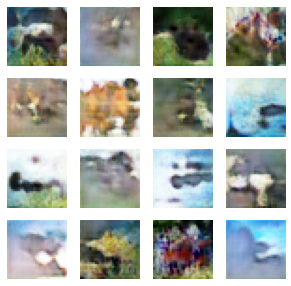

17000: [discriminator loss: 0.690261, acc: 0.515625] [adversarial loss: 0.908462, acc: 0.093750]
17001: [discriminator loss: 0.682836, acc: 0.593750] [adversarial loss: 0.643317, acc: 0.671875]
17002: [discriminator loss: 0.668098, acc: 0.585938] [adversarial loss: 1.094225, acc: 0.031250]
17003: [discriminator loss: 0.677771, acc: 0.585938] [adversarial loss: 0.422339, acc: 1.000000]
17004: [discriminator loss: 0.701770, acc: 0.500000] [adversarial loss: 1.174695, acc: 0.062500]
17005: [discriminator loss: 0.697491, acc: 0.554688] [adversarial loss: 0.366404, acc: 1.000000]
17006: [discriminator loss: 0.724306, acc: 0.507812] [adversarial loss: 0.944050, acc: 0.203125]
17007: [discriminator loss: 0.687388, acc: 0.601562] [adversarial loss: 0.421732, acc: 0.984375]
17008: [discriminator loss: 0.741046, acc: 0.468750] [adversarial loss: 0.748200, acc: 0.421875]
17009: [discriminator loss: 0.702732, acc: 0.546875] [adversarial loss: 0.540775, acc: 0.859375]
17010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


17498: [discriminator loss: 0.718127, acc: 0.515625] [adversarial loss: 0.530590, acc: 0.984375]
17499: [discriminator loss: 0.689741, acc: 0.515625] [adversarial loss: 0.842060, acc: 0.265625]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


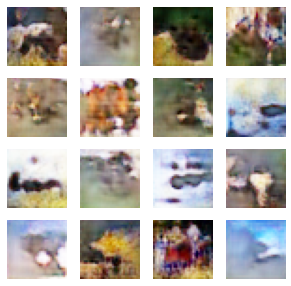

17500: [discriminator loss: 0.669697, acc: 0.656250] [adversarial loss: 0.583384, acc: 0.812500]
17501: [discriminator loss: 0.689271, acc: 0.484375] [adversarial loss: 0.848630, acc: 0.203125]
17502: [discriminator loss: 0.726423, acc: 0.492188] [adversarial loss: 0.498314, acc: 0.953125]
17503: [discriminator loss: 0.703543, acc: 0.476562] [adversarial loss: 0.924898, acc: 0.062500]
17504: [discriminator loss: 0.724403, acc: 0.546875] [adversarial loss: 0.636840, acc: 0.687500]
17505: [discriminator loss: 0.673642, acc: 0.539062] [adversarial loss: 1.057124, acc: 0.078125]
17506: [discriminator loss: 0.700148, acc: 0.531250] [adversarial loss: 0.577126, acc: 0.734375]
17507: [discriminator loss: 0.665087, acc: 0.585938] [adversarial loss: 1.301747, acc: 0.046875]
17508: [discriminator loss: 0.699461, acc: 0.500000] [adversarial loss: 0.428904, acc: 1.000000]
17509: [discriminator loss: 0.732355, acc: 0.500000] [adversarial loss: 1.051546, acc: 0.046875]
17510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


17998: [discriminator loss: 0.700218, acc: 0.523438] [adversarial loss: 0.956401, acc: 0.093750]
17999: [discriminator loss: 0.666058, acc: 0.601562] [adversarial loss: 0.591455, acc: 0.734375]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


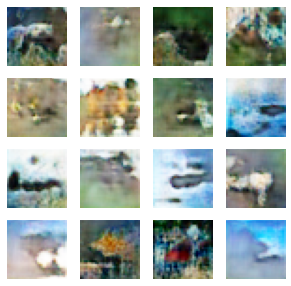

18000: [discriminator loss: 0.651699, acc: 0.593750] [adversarial loss: 0.736463, acc: 0.484375]
18001: [discriminator loss: 0.651123, acc: 0.632812] [adversarial loss: 0.639252, acc: 0.687500]
18002: [discriminator loss: 0.655233, acc: 0.609375] [adversarial loss: 0.628466, acc: 0.750000]
18003: [discriminator loss: 0.663094, acc: 0.617188] [adversarial loss: 0.699080, acc: 0.468750]
18004: [discriminator loss: 0.708097, acc: 0.539062] [adversarial loss: 0.468481, acc: 0.875000]
18005: [discriminator loss: 0.781972, acc: 0.437500] [adversarial loss: 1.039816, acc: 0.062500]
18006: [discriminator loss: 0.734146, acc: 0.515625] [adversarial loss: 0.459439, acc: 0.921875]
18007: [discriminator loss: 0.756197, acc: 0.507812] [adversarial loss: 1.260476, acc: 0.000000]
18008: [discriminator loss: 0.686890, acc: 0.523438] [adversarial loss: 0.693769, acc: 0.671875]
18009: [discriminator loss: 0.721979, acc: 0.476562] [adversarial loss: 0.980924, acc: 0.093750]
18010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


18498: [discriminator loss: 0.758025, acc: 0.476562] [adversarial loss: 0.911561, acc: 0.062500]
18499: [discriminator loss: 0.730543, acc: 0.531250] [adversarial loss: 0.568150, acc: 0.781250]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


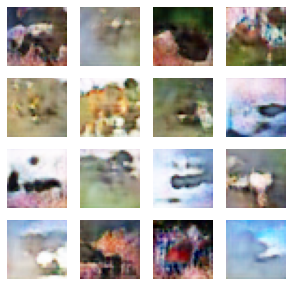

18500: [discriminator loss: 0.711239, acc: 0.484375] [adversarial loss: 0.935141, acc: 0.062500]
18501: [discriminator loss: 0.704663, acc: 0.554688] [adversarial loss: 0.563399, acc: 0.750000]
18502: [discriminator loss: 0.726516, acc: 0.500000] [adversarial loss: 1.340305, acc: 0.000000]
18503: [discriminator loss: 0.747367, acc: 0.531250] [adversarial loss: 0.440065, acc: 0.984375]
18504: [discriminator loss: 0.703924, acc: 0.523438] [adversarial loss: 1.062713, acc: 0.062500]
18505: [discriminator loss: 0.644944, acc: 0.593750] [adversarial loss: 0.589513, acc: 0.687500]
18506: [discriminator loss: 0.703749, acc: 0.562500] [adversarial loss: 1.018563, acc: 0.062500]
18507: [discriminator loss: 0.700423, acc: 0.531250] [adversarial loss: 0.430556, acc: 0.968750]
18508: [discriminator loss: 0.725275, acc: 0.453125] [adversarial loss: 0.971824, acc: 0.062500]
18509: [discriminator loss: 0.696859, acc: 0.531250] [adversarial loss: 0.599262, acc: 0.796875]
18510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


18998: [discriminator loss: 0.735836, acc: 0.515625] [adversarial loss: 1.217845, acc: 0.000000]
18999: [discriminator loss: 0.749916, acc: 0.554688] [adversarial loss: 0.297894, acc: 1.000000]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


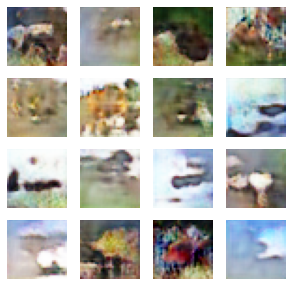

19000: [discriminator loss: 0.838355, acc: 0.507812] [adversarial loss: 0.836253, acc: 0.171875]
19001: [discriminator loss: 0.737311, acc: 0.492188] [adversarial loss: 0.523551, acc: 0.890625]
19002: [discriminator loss: 0.701439, acc: 0.492188] [adversarial loss: 0.819206, acc: 0.203125]
19003: [discriminator loss: 0.689174, acc: 0.562500] [adversarial loss: 0.763698, acc: 0.390625]
19004: [discriminator loss: 0.684938, acc: 0.523438] [adversarial loss: 0.880123, acc: 0.109375]
19005: [discriminator loss: 0.684013, acc: 0.554688] [adversarial loss: 0.780700, acc: 0.296875]
19006: [discriminator loss: 0.658460, acc: 0.617188] [adversarial loss: 0.693430, acc: 0.593750]
19007: [discriminator loss: 0.697140, acc: 0.500000] [adversarial loss: 0.882041, acc: 0.140625]
19008: [discriminator loss: 0.736402, acc: 0.468750] [adversarial loss: 0.589120, acc: 0.796875]
19009: [discriminator loss: 0.700974, acc: 0.492188] [adversarial loss: 0.977170, acc: 0.046875]
19010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


19498: [discriminator loss: 0.703142, acc: 0.507812] [adversarial loss: 0.931580, acc: 0.062500]
19499: [discriminator loss: 0.726827, acc: 0.492188] [adversarial loss: 0.496676, acc: 0.968750]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


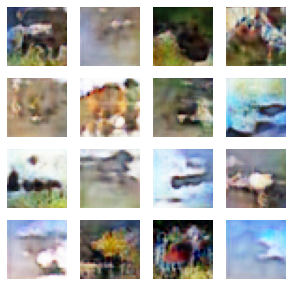

19500: [discriminator loss: 0.727167, acc: 0.476562] [adversarial loss: 0.920014, acc: 0.078125]
19501: [discriminator loss: 0.711413, acc: 0.539062] [adversarial loss: 0.503990, acc: 0.968750]
19502: [discriminator loss: 0.706549, acc: 0.507812] [adversarial loss: 0.983080, acc: 0.015625]
19503: [discriminator loss: 0.722665, acc: 0.515625] [adversarial loss: 0.551150, acc: 0.859375]
19504: [discriminator loss: 0.721568, acc: 0.523438] [adversarial loss: 1.030035, acc: 0.031250]
19505: [discriminator loss: 0.718915, acc: 0.523438] [adversarial loss: 0.578072, acc: 0.796875]
19506: [discriminator loss: 0.720628, acc: 0.539062] [adversarial loss: 1.060389, acc: 0.062500]
19507: [discriminator loss: 0.706581, acc: 0.515625] [adversarial loss: 0.496312, acc: 0.906250]
19508: [discriminator loss: 0.724624, acc: 0.546875] [adversarial loss: 0.984283, acc: 0.093750]
19509: [discriminator loss: 0.701551, acc: 0.562500] [adversarial loss: 0.418788, acc: 1.000000]
19510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


19998: [discriminator loss: 0.793515, acc: 0.492188] [adversarial loss: 0.410475, acc: 0.984375]
19999: [discriminator loss: 0.770379, acc: 0.484375] [adversarial loss: 0.819379, acc: 0.187500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


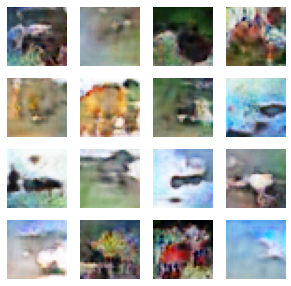

20000: [discriminator loss: 0.715298, acc: 0.562500] [adversarial loss: 0.706396, acc: 0.468750]
20001: [discriminator loss: 0.710493, acc: 0.531250] [adversarial loss: 0.703391, acc: 0.500000]
20002: [discriminator loss: 0.671408, acc: 0.585938] [adversarial loss: 0.816106, acc: 0.250000]
20003: [discriminator loss: 0.717224, acc: 0.507812] [adversarial loss: 0.752432, acc: 0.343750]
20004: [discriminator loss: 0.648382, acc: 0.648438] [adversarial loss: 0.796924, acc: 0.312500]
20005: [discriminator loss: 0.679471, acc: 0.625000] [adversarial loss: 0.813261, acc: 0.250000]
20006: [discriminator loss: 0.663768, acc: 0.609375] [adversarial loss: 0.621013, acc: 0.718750]
20007: [discriminator loss: 0.677436, acc: 0.570312] [adversarial loss: 0.859922, acc: 0.218750]
20008: [discriminator loss: 0.709758, acc: 0.554688] [adversarial loss: 0.535357, acc: 0.843750]
20009: [discriminator loss: 0.693397, acc: 0.531250] [adversarial loss: 1.231290, acc: 0.000000]
20010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


20498: [discriminator loss: 0.713827, acc: 0.492188] [adversarial loss: 0.553280, acc: 0.843750]
20499: [discriminator loss: 0.703606, acc: 0.531250] [adversarial loss: 0.876550, acc: 0.109375]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


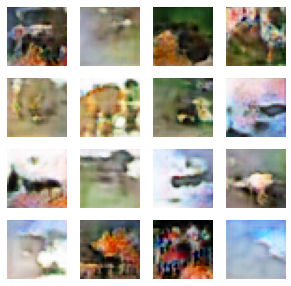

20500: [discriminator loss: 0.710247, acc: 0.507812] [adversarial loss: 0.531280, acc: 0.921875]
20501: [discriminator loss: 0.694286, acc: 0.539062] [adversarial loss: 0.996977, acc: 0.062500]
20502: [discriminator loss: 0.690310, acc: 0.531250] [adversarial loss: 0.540334, acc: 0.843750]
20503: [discriminator loss: 0.707361, acc: 0.515625] [adversarial loss: 1.056580, acc: 0.000000]
20504: [discriminator loss: 0.676805, acc: 0.546875] [adversarial loss: 0.538437, acc: 0.843750]
20505: [discriminator loss: 0.683058, acc: 0.539062] [adversarial loss: 0.971500, acc: 0.109375]
20506: [discriminator loss: 0.694937, acc: 0.578125] [adversarial loss: 0.536712, acc: 0.859375]
20507: [discriminator loss: 0.668876, acc: 0.570312] [adversarial loss: 0.900468, acc: 0.187500]
20508: [discriminator loss: 0.689019, acc: 0.507812] [adversarial loss: 0.589878, acc: 0.843750]
20509: [discriminator loss: 0.661892, acc: 0.648438] [adversarial loss: 0.819000, acc: 0.296875]
20510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


20998: [discriminator loss: 0.712308, acc: 0.500000] [adversarial loss: 0.966769, acc: 0.078125]
20999: [discriminator loss: 0.702312, acc: 0.523438] [adversarial loss: 0.632749, acc: 0.656250]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


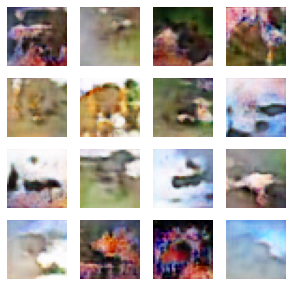

21000: [discriminator loss: 0.694573, acc: 0.546875] [adversarial loss: 1.129054, acc: 0.000000]
21001: [discriminator loss: 0.677236, acc: 0.570312] [adversarial loss: 0.571097, acc: 0.796875]
21002: [discriminator loss: 0.688752, acc: 0.531250] [adversarial loss: 0.922920, acc: 0.125000]
21003: [discriminator loss: 0.655126, acc: 0.585938] [adversarial loss: 0.558354, acc: 0.796875]
21004: [discriminator loss: 0.675075, acc: 0.554688] [adversarial loss: 0.889501, acc: 0.140625]
21005: [discriminator loss: 0.704744, acc: 0.515625] [adversarial loss: 0.454045, acc: 0.953125]
21006: [discriminator loss: 0.706250, acc: 0.500000] [adversarial loss: 0.879850, acc: 0.203125]
21007: [discriminator loss: 0.725719, acc: 0.539062] [adversarial loss: 0.481108, acc: 0.937500]
21008: [discriminator loss: 0.726787, acc: 0.484375] [adversarial loss: 1.070837, acc: 0.062500]
21009: [discriminator loss: 0.742204, acc: 0.539062] [adversarial loss: 0.490878, acc: 0.906250]
21010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


21498: [discriminator loss: 0.686641, acc: 0.531250] [adversarial loss: 0.998249, acc: 0.015625]
21499: [discriminator loss: 0.666572, acc: 0.601562] [adversarial loss: 0.538760, acc: 0.812500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


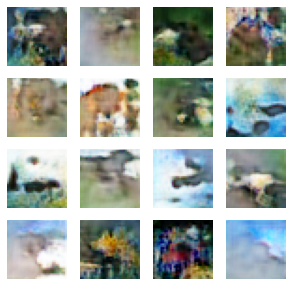

21500: [discriminator loss: 0.655821, acc: 0.562500] [adversarial loss: 1.021302, acc: 0.093750]
21501: [discriminator loss: 0.664788, acc: 0.609375] [adversarial loss: 0.473331, acc: 0.859375]
21502: [discriminator loss: 0.708180, acc: 0.531250] [adversarial loss: 1.027333, acc: 0.093750]
21503: [discriminator loss: 0.678066, acc: 0.562500] [adversarial loss: 0.356764, acc: 0.968750]
21504: [discriminator loss: 0.717377, acc: 0.546875] [adversarial loss: 0.867313, acc: 0.203125]
21505: [discriminator loss: 0.692401, acc: 0.585938] [adversarial loss: 0.572170, acc: 0.750000]
21506: [discriminator loss: 0.733675, acc: 0.468750] [adversarial loss: 0.613097, acc: 0.671875]
21507: [discriminator loss: 0.714380, acc: 0.484375] [adversarial loss: 0.612804, acc: 0.687500]
21508: [discriminator loss: 0.736307, acc: 0.453125] [adversarial loss: 0.790399, acc: 0.265625]
21509: [discriminator loss: 0.682065, acc: 0.578125] [adversarial loss: 0.826349, acc: 0.171875]
21510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


21998: [discriminator loss: 0.775969, acc: 0.492188] [adversarial loss: 0.395200, acc: 0.984375]
21999: [discriminator loss: 0.775698, acc: 0.492188] [adversarial loss: 0.873511, acc: 0.171875]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


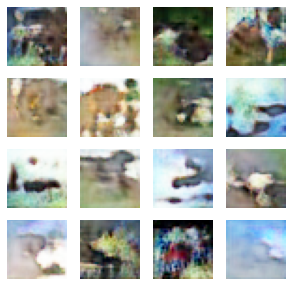

22000: [discriminator loss: 0.754750, acc: 0.531250] [adversarial loss: 0.529617, acc: 0.937500]
22001: [discriminator loss: 0.710070, acc: 0.507812] [adversarial loss: 0.945522, acc: 0.031250]
22002: [discriminator loss: 0.687239, acc: 0.523438] [adversarial loss: 0.698572, acc: 0.484375]
22003: [discriminator loss: 0.674450, acc: 0.507812] [adversarial loss: 1.003328, acc: 0.031250]
22004: [discriminator loss: 0.666343, acc: 0.578125] [adversarial loss: 0.605562, acc: 0.718750]
22005: [discriminator loss: 0.662223, acc: 0.554688] [adversarial loss: 0.929463, acc: 0.187500]
22006: [discriminator loss: 0.717066, acc: 0.515625] [adversarial loss: 0.461396, acc: 0.953125]
22007: [discriminator loss: 0.708163, acc: 0.539062] [adversarial loss: 0.974689, acc: 0.109375]
22008: [discriminator loss: 0.746546, acc: 0.507812] [adversarial loss: 0.333481, acc: 1.000000]
22009: [discriminator loss: 0.755162, acc: 0.515625] [adversarial loss: 0.887035, acc: 0.109375]
22010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


22498: [discriminator loss: 0.680507, acc: 0.578125] [adversarial loss: 0.541357, acc: 0.796875]
22499: [discriminator loss: 0.716903, acc: 0.476562] [adversarial loss: 0.963784, acc: 0.093750]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


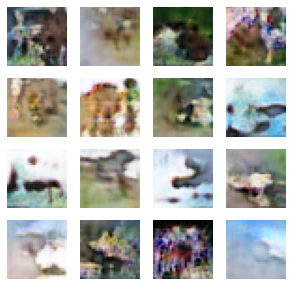

22500: [discriminator loss: 0.711980, acc: 0.562500] [adversarial loss: 0.546283, acc: 0.843750]
22501: [discriminator loss: 0.706952, acc: 0.476562] [adversarial loss: 0.939373, acc: 0.125000]
22502: [discriminator loss: 0.742345, acc: 0.492188] [adversarial loss: 0.550501, acc: 0.828125]
22503: [discriminator loss: 0.757274, acc: 0.523438] [adversarial loss: 1.286731, acc: 0.000000]
22504: [discriminator loss: 0.705331, acc: 0.539062] [adversarial loss: 0.421410, acc: 0.968750]
22505: [discriminator loss: 0.740313, acc: 0.507812] [adversarial loss: 1.097609, acc: 0.093750]
22506: [discriminator loss: 0.733900, acc: 0.539062] [adversarial loss: 0.426684, acc: 0.984375]
22507: [discriminator loss: 0.698107, acc: 0.531250] [adversarial loss: 0.862982, acc: 0.156250]
22508: [discriminator loss: 0.690015, acc: 0.578125] [adversarial loss: 0.625685, acc: 0.687500]
22509: [discriminator loss: 0.700338, acc: 0.515625] [adversarial loss: 0.968447, acc: 0.125000]
22510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


22998: [discriminator loss: 0.668146, acc: 0.617188] [adversarial loss: 0.602913, acc: 0.734375]
22999: [discriminator loss: 0.644807, acc: 0.601562] [adversarial loss: 0.926786, acc: 0.187500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


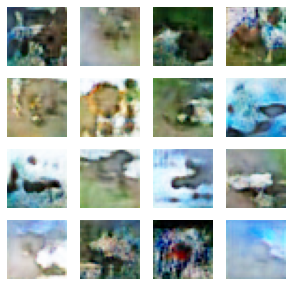

23000: [discriminator loss: 0.602067, acc: 0.718750] [adversarial loss: 0.513532, acc: 0.859375]
23001: [discriminator loss: 0.629462, acc: 0.601562] [adversarial loss: 0.710569, acc: 0.546875]
23002: [discriminator loss: 0.616232, acc: 0.718750] [adversarial loss: 0.571280, acc: 0.718750]
23003: [discriminator loss: 0.656824, acc: 0.617188] [adversarial loss: 0.477311, acc: 0.843750]
23004: [discriminator loss: 0.682824, acc: 0.585938] [adversarial loss: 0.655755, acc: 0.578125]
23005: [discriminator loss: 0.714357, acc: 0.523438] [adversarial loss: 0.399325, acc: 0.921875]
23006: [discriminator loss: 0.732781, acc: 0.507812] [adversarial loss: 0.869422, acc: 0.250000]
23007: [discriminator loss: 0.732304, acc: 0.531250] [adversarial loss: 0.428714, acc: 0.937500]
23008: [discriminator loss: 0.755157, acc: 0.500000] [adversarial loss: 1.168667, acc: 0.015625]
23009: [discriminator loss: 0.746453, acc: 0.523438] [adversarial loss: 0.500312, acc: 0.906250]
23010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


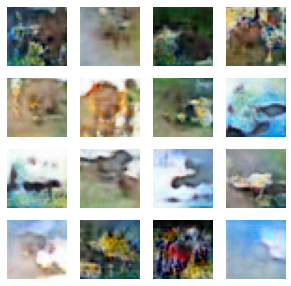

23500: [discriminator loss: 0.677259, acc: 0.609375] [adversarial loss: 0.536862, acc: 0.796875]
23501: [discriminator loss: 0.677960, acc: 0.546875] [adversarial loss: 1.096129, acc: 0.031250]
23502: [discriminator loss: 0.634492, acc: 0.593750] [adversarial loss: 0.482836, acc: 0.828125]
23503: [discriminator loss: 0.679746, acc: 0.539062] [adversarial loss: 1.036036, acc: 0.062500]
23504: [discriminator loss: 0.696346, acc: 0.562500] [adversarial loss: 0.424396, acc: 0.984375]
23505: [discriminator loss: 0.663912, acc: 0.523438] [adversarial loss: 0.910354, acc: 0.171875]
23506: [discriminator loss: 0.718288, acc: 0.578125] [adversarial loss: 0.316993, acc: 1.000000]
23507: [discriminator loss: 0.745307, acc: 0.500000] [adversarial loss: 0.866949, acc: 0.234375]
23508: [discriminator loss: 0.707686, acc: 0.562500] [adversarial loss: 0.453938, acc: 0.953125]
23509: [discriminator loss: 0.674902, acc: 0.546875] [adversarial loss: 0.718582, acc: 0.531250]
23510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


23998: [discriminator loss: 0.670631, acc: 0.554688] [adversarial loss: 0.778804, acc: 0.343750]
23999: [discriminator loss: 0.745878, acc: 0.476562] [adversarial loss: 0.368611, acc: 1.000000]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


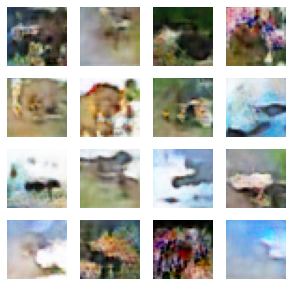

24000: [discriminator loss: 0.815484, acc: 0.507812] [adversarial loss: 1.233786, acc: 0.000000]
24001: [discriminator loss: 0.842229, acc: 0.500000] [adversarial loss: 0.327908, acc: 1.000000]
24002: [discriminator loss: 0.799420, acc: 0.500000] [adversarial loss: 0.793441, acc: 0.265625]
24003: [discriminator loss: 0.739366, acc: 0.468750] [adversarial loss: 0.547224, acc: 0.875000]
24004: [discriminator loss: 0.690781, acc: 0.515625] [adversarial loss: 0.824096, acc: 0.234375]
24005: [discriminator loss: 0.648941, acc: 0.679688] [adversarial loss: 0.890513, acc: 0.140625]
24006: [discriminator loss: 0.647548, acc: 0.648438] [adversarial loss: 0.893977, acc: 0.109375]
24007: [discriminator loss: 0.639608, acc: 0.664062] [adversarial loss: 1.003518, acc: 0.125000]
24008: [discriminator loss: 0.635576, acc: 0.648438] [adversarial loss: 0.689382, acc: 0.531250]
24009: [discriminator loss: 0.657463, acc: 0.562500] [adversarial loss: 0.849721, acc: 0.187500]
24010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


24498: [discriminator loss: 0.705837, acc: 0.507812] [adversarial loss: 1.109093, acc: 0.062500]
24499: [discriminator loss: 0.715022, acc: 0.507812] [adversarial loss: 0.441623, acc: 0.859375]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


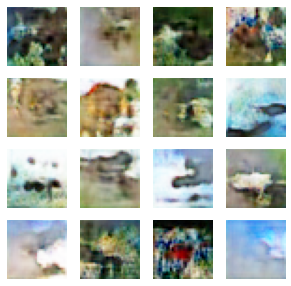

24500: [discriminator loss: 0.841987, acc: 0.476562] [adversarial loss: 1.273473, acc: 0.031250]
24501: [discriminator loss: 0.690923, acc: 0.578125] [adversarial loss: 0.587640, acc: 0.765625]
24502: [discriminator loss: 0.641776, acc: 0.562500] [adversarial loss: 0.941273, acc: 0.125000]
24503: [discriminator loss: 0.630807, acc: 0.679688] [adversarial loss: 0.508185, acc: 0.890625]
24504: [discriminator loss: 0.676068, acc: 0.539062] [adversarial loss: 0.979821, acc: 0.187500]
24505: [discriminator loss: 0.658141, acc: 0.609375] [adversarial loss: 0.444686, acc: 0.953125]
24506: [discriminator loss: 0.669267, acc: 0.546875] [adversarial loss: 0.955731, acc: 0.203125]
24507: [discriminator loss: 0.664874, acc: 0.554688] [adversarial loss: 0.499755, acc: 0.859375]
24508: [discriminator loss: 0.709330, acc: 0.531250] [adversarial loss: 0.921679, acc: 0.218750]
24509: [discriminator loss: 0.726598, acc: 0.546875] [adversarial loss: 0.467336, acc: 0.953125]
24510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


24998: [discriminator loss: 0.669888, acc: 0.578125] [adversarial loss: 0.887016, acc: 0.171875]
24999: [discriminator loss: 0.688931, acc: 0.531250] [adversarial loss: 0.499883, acc: 0.890625]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


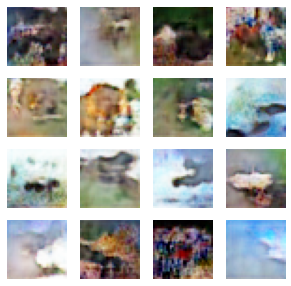

25000: [discriminator loss: 0.727929, acc: 0.460938] [adversarial loss: 0.986998, acc: 0.046875]
25001: [discriminator loss: 0.747992, acc: 0.484375] [adversarial loss: 0.460394, acc: 0.968750]
25002: [discriminator loss: 0.761039, acc: 0.460938] [adversarial loss: 1.035099, acc: 0.078125]
25003: [discriminator loss: 0.766803, acc: 0.476562] [adversarial loss: 0.394967, acc: 1.000000]
25004: [discriminator loss: 0.733604, acc: 0.562500] [adversarial loss: 1.067572, acc: 0.015625]
25005: [discriminator loss: 0.693933, acc: 0.546875] [adversarial loss: 0.539131, acc: 0.843750]
25006: [discriminator loss: 0.716883, acc: 0.554688] [adversarial loss: 1.199000, acc: 0.015625]
25007: [discriminator loss: 0.734605, acc: 0.523438] [adversarial loss: 0.487083, acc: 0.937500]
25008: [discriminator loss: 0.717024, acc: 0.507812] [adversarial loss: 0.956161, acc: 0.109375]
25009: [discriminator loss: 0.708180, acc: 0.523438] [adversarial loss: 0.562757, acc: 0.796875]
25010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


25498: [discriminator loss: 0.747047, acc: 0.468750] [adversarial loss: 0.529656, acc: 0.906250]
25499: [discriminator loss: 0.718203, acc: 0.515625] [adversarial loss: 1.013364, acc: 0.062500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


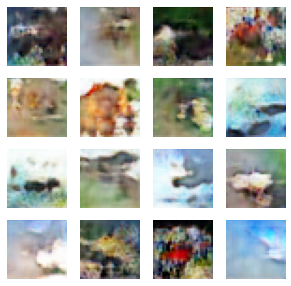

25500: [discriminator loss: 0.696056, acc: 0.515625] [adversarial loss: 0.667281, acc: 0.609375]
25501: [discriminator loss: 0.660941, acc: 0.609375] [adversarial loss: 1.223465, acc: 0.015625]
25502: [discriminator loss: 0.684428, acc: 0.546875] [adversarial loss: 0.553726, acc: 0.859375]
25503: [discriminator loss: 0.678353, acc: 0.507812] [adversarial loss: 0.945635, acc: 0.078125]
25504: [discriminator loss: 0.666755, acc: 0.593750] [adversarial loss: 0.514982, acc: 0.875000]
25505: [discriminator loss: 0.721643, acc: 0.531250] [adversarial loss: 1.080294, acc: 0.062500]
25506: [discriminator loss: 0.755302, acc: 0.546875] [adversarial loss: 0.446875, acc: 0.968750]
25507: [discriminator loss: 0.771369, acc: 0.515625] [adversarial loss: 1.050344, acc: 0.046875]
25508: [discriminator loss: 0.738906, acc: 0.531250] [adversarial loss: 0.520859, acc: 0.906250]
25509: [discriminator loss: 0.742311, acc: 0.445312] [adversarial loss: 0.825352, acc: 0.250000]
25510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


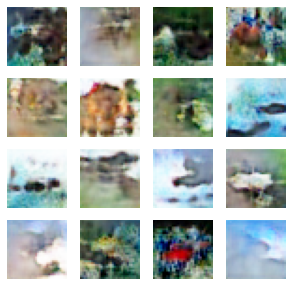

26000: [discriminator loss: 0.684940, acc: 0.507812] [adversarial loss: 1.037758, acc: 0.062500]
26001: [discriminator loss: 0.652855, acc: 0.664062] [adversarial loss: 0.653136, acc: 0.593750]
26002: [discriminator loss: 0.658606, acc: 0.578125] [adversarial loss: 0.860130, acc: 0.234375]
26003: [discriminator loss: 0.658591, acc: 0.656250] [adversarial loss: 0.533440, acc: 0.843750]
26004: [discriminator loss: 0.672542, acc: 0.593750] [adversarial loss: 0.757932, acc: 0.390625]
26005: [discriminator loss: 0.665421, acc: 0.648438] [adversarial loss: 0.397283, acc: 0.953125]
26006: [discriminator loss: 0.713832, acc: 0.523438] [adversarial loss: 0.989549, acc: 0.078125]
26007: [discriminator loss: 0.720277, acc: 0.507812] [adversarial loss: 0.452634, acc: 0.953125]
26008: [discriminator loss: 0.718999, acc: 0.500000] [adversarial loss: 0.859454, acc: 0.203125]
26009: [discriminator loss: 0.681601, acc: 0.585938] [adversarial loss: 0.645536, acc: 0.609375]
26010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


26498: [discriminator loss: 0.678777, acc: 0.554688] [adversarial loss: 1.003996, acc: 0.046875]
26499: [discriminator loss: 0.701048, acc: 0.578125] [adversarial loss: 0.434242, acc: 0.953125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


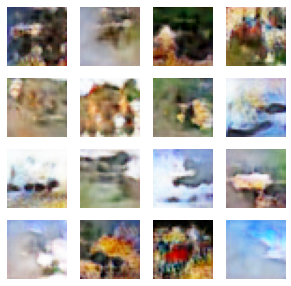

26500: [discriminator loss: 0.712301, acc: 0.546875] [adversarial loss: 1.047347, acc: 0.046875]
26501: [discriminator loss: 0.721825, acc: 0.546875] [adversarial loss: 0.474297, acc: 0.937500]
26502: [discriminator loss: 0.690382, acc: 0.539062] [adversarial loss: 0.929572, acc: 0.171875]
26503: [discriminator loss: 0.731003, acc: 0.539062] [adversarial loss: 0.474215, acc: 0.906250]
26504: [discriminator loss: 0.731996, acc: 0.468750] [adversarial loss: 0.870043, acc: 0.156250]
26505: [discriminator loss: 0.709653, acc: 0.515625] [adversarial loss: 0.551013, acc: 0.906250]
26506: [discriminator loss: 0.703528, acc: 0.445312] [adversarial loss: 0.926346, acc: 0.171875]
26507: [discriminator loss: 0.675213, acc: 0.539062] [adversarial loss: 0.622693, acc: 0.734375]
26508: [discriminator loss: 0.687623, acc: 0.546875] [adversarial loss: 0.965242, acc: 0.062500]
26509: [discriminator loss: 0.667866, acc: 0.601562] [adversarial loss: 0.606183, acc: 0.656250]
26510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


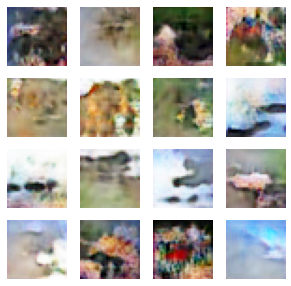

27000: [discriminator loss: 0.718851, acc: 0.500000] [adversarial loss: 0.689028, acc: 0.500000]
27001: [discriminator loss: 0.690066, acc: 0.539062] [adversarial loss: 0.819690, acc: 0.375000]
27002: [discriminator loss: 0.711136, acc: 0.554688] [adversarial loss: 0.602540, acc: 0.765625]
27003: [discriminator loss: 0.734949, acc: 0.445312] [adversarial loss: 1.024363, acc: 0.046875]
27004: [discriminator loss: 0.708249, acc: 0.554688] [adversarial loss: 0.434370, acc: 1.000000]
27005: [discriminator loss: 0.721282, acc: 0.507812] [adversarial loss: 1.227891, acc: 0.015625]
27006: [discriminator loss: 0.723097, acc: 0.531250] [adversarial loss: 0.396543, acc: 0.953125]
27007: [discriminator loss: 0.710908, acc: 0.507812] [adversarial loss: 1.127484, acc: 0.015625]
27008: [discriminator loss: 0.669855, acc: 0.562500] [adversarial loss: 0.576874, acc: 0.765625]
27009: [discriminator loss: 0.651845, acc: 0.593750] [adversarial loss: 0.772597, acc: 0.421875]
27010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


27498: [discriminator loss: 0.685823, acc: 0.570312] [adversarial loss: 0.977889, acc: 0.046875]
27499: [discriminator loss: 0.688699, acc: 0.539062] [adversarial loss: 0.566388, acc: 0.843750]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


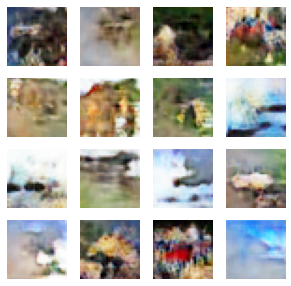

27500: [discriminator loss: 0.722498, acc: 0.523438] [adversarial loss: 0.877874, acc: 0.171875]
27501: [discriminator loss: 0.706265, acc: 0.546875] [adversarial loss: 0.494354, acc: 0.843750]
27502: [discriminator loss: 0.731833, acc: 0.460938] [adversarial loss: 0.928274, acc: 0.078125]
27503: [discriminator loss: 0.696218, acc: 0.546875] [adversarial loss: 0.549593, acc: 0.859375]
27504: [discriminator loss: 0.695488, acc: 0.546875] [adversarial loss: 0.924475, acc: 0.093750]
27505: [discriminator loss: 0.686147, acc: 0.531250] [adversarial loss: 0.659608, acc: 0.593750]
27506: [discriminator loss: 0.673462, acc: 0.617188] [adversarial loss: 1.004922, acc: 0.093750]
27507: [discriminator loss: 0.682590, acc: 0.554688] [adversarial loss: 0.599789, acc: 0.671875]
27508: [discriminator loss: 0.744157, acc: 0.453125] [adversarial loss: 1.009269, acc: 0.046875]
27509: [discriminator loss: 0.768731, acc: 0.523438] [adversarial loss: 0.432209, acc: 0.984375]
27510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


27999: [discriminator loss: 0.724438, acc: 0.437500] [adversarial loss: 0.763765, acc: 0.312500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


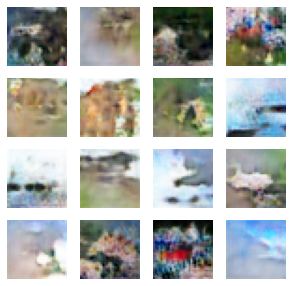

28000: [discriminator loss: 0.706160, acc: 0.539062] [adversarial loss: 0.633051, acc: 0.703125]
28001: [discriminator loss: 0.729856, acc: 0.406250] [adversarial loss: 0.824324, acc: 0.234375]
28002: [discriminator loss: 0.690934, acc: 0.578125] [adversarial loss: 0.600443, acc: 0.656250]
28003: [discriminator loss: 0.713580, acc: 0.500000] [adversarial loss: 1.035786, acc: 0.000000]
28004: [discriminator loss: 0.658616, acc: 0.554688] [adversarial loss: 0.669906, acc: 0.578125]
28005: [discriminator loss: 0.665768, acc: 0.570312] [adversarial loss: 0.945245, acc: 0.203125]
28006: [discriminator loss: 0.634813, acc: 0.632812] [adversarial loss: 0.510956, acc: 0.890625]
28007: [discriminator loss: 0.694456, acc: 0.476562] [adversarial loss: 1.276933, acc: 0.015625]
28008: [discriminator loss: 0.755475, acc: 0.515625] [adversarial loss: 0.367848, acc: 0.968750]
28009: [discriminator loss: 0.775708, acc: 0.500000] [adversarial loss: 1.246927, acc: 0.078125]
28010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


28498: [discriminator loss: 0.671231, acc: 0.570312] [adversarial loss: 0.713480, acc: 0.546875]
28499: [discriminator loss: 0.702007, acc: 0.500000] [adversarial loss: 0.792270, acc: 0.312500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


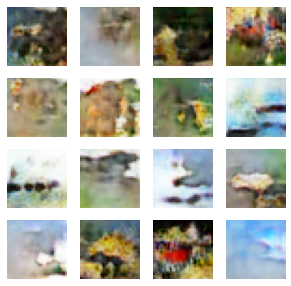

28500: [discriminator loss: 0.711707, acc: 0.539062] [adversarial loss: 0.668666, acc: 0.578125]
28501: [discriminator loss: 0.675471, acc: 0.601562] [adversarial loss: 0.933986, acc: 0.062500]
28502: [discriminator loss: 0.675301, acc: 0.546875] [adversarial loss: 0.605083, acc: 0.703125]
28503: [discriminator loss: 0.700043, acc: 0.476562] [adversarial loss: 1.061699, acc: 0.046875]
28504: [discriminator loss: 0.722136, acc: 0.515625] [adversarial loss: 0.461916, acc: 0.921875]
28505: [discriminator loss: 0.754067, acc: 0.468750] [adversarial loss: 1.338937, acc: 0.046875]
28506: [discriminator loss: 0.802686, acc: 0.507812] [adversarial loss: 0.360039, acc: 1.000000]
28507: [discriminator loss: 0.761249, acc: 0.500000] [adversarial loss: 1.144552, acc: 0.031250]
28508: [discriminator loss: 0.720263, acc: 0.523438] [adversarial loss: 0.528067, acc: 0.843750]
28509: [discriminator loss: 0.689526, acc: 0.539062] [adversarial loss: 0.936952, acc: 0.234375]
28510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


28998: [discriminator loss: 0.697546, acc: 0.539062] [adversarial loss: 0.668804, acc: 0.625000]
28999: [discriminator loss: 0.718074, acc: 0.492188] [adversarial loss: 0.926030, acc: 0.125000]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


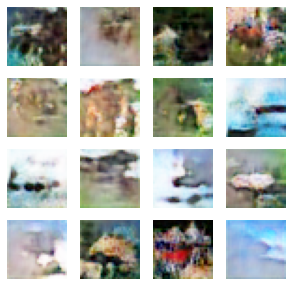

29000: [discriminator loss: 0.684695, acc: 0.539062] [adversarial loss: 0.721712, acc: 0.453125]
29001: [discriminator loss: 0.697608, acc: 0.492188] [adversarial loss: 0.902002, acc: 0.140625]
29002: [discriminator loss: 0.670180, acc: 0.617188] [adversarial loss: 0.773395, acc: 0.328125]
29003: [discriminator loss: 0.647642, acc: 0.640625] [adversarial loss: 0.849637, acc: 0.218750]
29004: [discriminator loss: 0.640561, acc: 0.648438] [adversarial loss: 0.855183, acc: 0.140625]
29005: [discriminator loss: 0.618365, acc: 0.687500] [adversarial loss: 0.542260, acc: 0.859375]
29006: [discriminator loss: 0.637004, acc: 0.570312] [adversarial loss: 0.925485, acc: 0.156250]
29007: [discriminator loss: 0.661005, acc: 0.625000] [adversarial loss: 0.430873, acc: 0.937500]
29008: [discriminator loss: 0.675666, acc: 0.578125] [adversarial loss: 0.884287, acc: 0.281250]
29009: [discriminator loss: 0.803660, acc: 0.492188] [adversarial loss: 0.273852, acc: 1.000000]
29010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


29498: [discriminator loss: 0.664566, acc: 0.593750] [adversarial loss: 1.267201, acc: 0.000000]
29499: [discriminator loss: 0.653857, acc: 0.546875] [adversarial loss: 0.476389, acc: 0.953125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


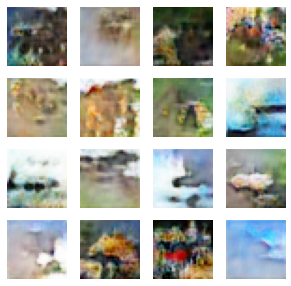

29500: [discriminator loss: 0.652091, acc: 0.539062] [adversarial loss: 1.223875, acc: 0.031250]
29501: [discriminator loss: 0.659328, acc: 0.593750] [adversarial loss: 0.482716, acc: 0.890625]
29502: [discriminator loss: 0.672648, acc: 0.570312] [adversarial loss: 0.918603, acc: 0.218750]
29503: [discriminator loss: 0.710794, acc: 0.554688] [adversarial loss: 0.414982, acc: 0.953125]
29504: [discriminator loss: 0.711513, acc: 0.492188] [adversarial loss: 0.876234, acc: 0.265625]
29505: [discriminator loss: 0.742305, acc: 0.539062] [adversarial loss: 0.385219, acc: 0.921875]
29506: [discriminator loss: 0.741271, acc: 0.476562] [adversarial loss: 0.712159, acc: 0.406250]
29507: [discriminator loss: 0.787002, acc: 0.445312] [adversarial loss: 0.522433, acc: 0.828125]
29508: [discriminator loss: 0.773603, acc: 0.437500] [adversarial loss: 0.698422, acc: 0.500000]
29509: [discriminator loss: 0.706702, acc: 0.515625] [adversarial loss: 0.765250, acc: 0.343750]
29510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


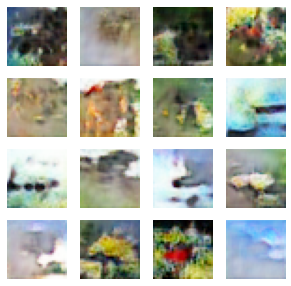

30000: [discriminator loss: 0.659267, acc: 0.578125] [adversarial loss: 0.659852, acc: 0.593750]
30001: [discriminator loss: 0.629508, acc: 0.625000] [adversarial loss: 1.079004, acc: 0.031250]
30002: [discriminator loss: 0.647048, acc: 0.648438] [adversarial loss: 0.485207, acc: 0.921875]
30003: [discriminator loss: 0.671531, acc: 0.531250] [adversarial loss: 1.103903, acc: 0.046875]
30004: [discriminator loss: 0.715360, acc: 0.585938] [adversarial loss: 0.301323, acc: 1.000000]
30005: [discriminator loss: 0.792241, acc: 0.476562] [adversarial loss: 1.026350, acc: 0.218750]
30006: [discriminator loss: 0.831386, acc: 0.492188] [adversarial loss: 0.375657, acc: 0.953125]
30007: [discriminator loss: 0.794224, acc: 0.460938] [adversarial loss: 0.874803, acc: 0.203125]
30008: [discriminator loss: 0.761878, acc: 0.476562] [adversarial loss: 0.538205, acc: 0.875000]
30009: [discriminator loss: 0.717881, acc: 0.468750] [adversarial loss: 0.998094, acc: 0.078125]
30010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


30498: [discriminator loss: 0.784031, acc: 0.515625] [adversarial loss: 0.844781, acc: 0.218750]
30499: [discriminator loss: 0.788916, acc: 0.460938] [adversarial loss: 0.500746, acc: 0.953125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


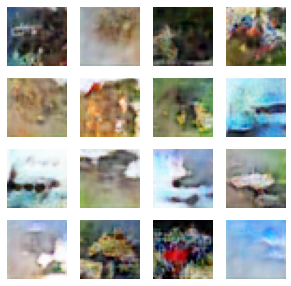

30500: [discriminator loss: 0.787171, acc: 0.289062] [adversarial loss: 0.810951, acc: 0.328125]
30501: [discriminator loss: 0.752976, acc: 0.476562] [adversarial loss: 0.530210, acc: 0.859375]
30502: [discriminator loss: 0.714619, acc: 0.507812] [adversarial loss: 1.106027, acc: 0.046875]
30503: [discriminator loss: 0.682200, acc: 0.546875] [adversarial loss: 0.631106, acc: 0.640625]
30504: [discriminator loss: 0.651807, acc: 0.609375] [adversarial loss: 1.077525, acc: 0.062500]
30505: [discriminator loss: 0.668978, acc: 0.562500] [adversarial loss: 0.638626, acc: 0.625000]
30506: [discriminator loss: 0.645894, acc: 0.570312] [adversarial loss: 1.176015, acc: 0.062500]
30507: [discriminator loss: 0.691337, acc: 0.578125] [adversarial loss: 0.418425, acc: 0.968750]
30508: [discriminator loss: 0.696132, acc: 0.531250] [adversarial loss: 1.120747, acc: 0.078125]
30509: [discriminator loss: 0.694354, acc: 0.554688] [adversarial loss: 0.405417, acc: 1.000000]
30510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

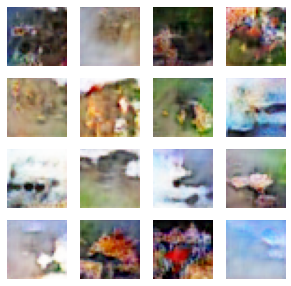

31000: [discriminator loss: 0.814259, acc: 0.484375] [adversarial loss: 1.123063, acc: 0.046875]
31001: [discriminator loss: 0.777703, acc: 0.546875] [adversarial loss: 0.510893, acc: 0.953125]
31002: [discriminator loss: 0.716997, acc: 0.500000] [adversarial loss: 1.173401, acc: 0.015625]
31003: [discriminator loss: 0.674779, acc: 0.578125] [adversarial loss: 0.656114, acc: 0.609375]
31004: [discriminator loss: 0.633934, acc: 0.593750] [adversarial loss: 1.076962, acc: 0.062500]
31005: [discriminator loss: 0.638826, acc: 0.625000] [adversarial loss: 0.600985, acc: 0.687500]
31006: [discriminator loss: 0.649136, acc: 0.640625] [adversarial loss: 0.932230, acc: 0.140625]
31007: [discriminator loss: 0.634959, acc: 0.648438] [adversarial loss: 0.395472, acc: 1.000000]
31008: [discriminator loss: 0.726263, acc: 0.562500] [adversarial loss: 1.033400, acc: 0.062500]
31009: [discriminator loss: 0.772891, acc: 0.531250] [adversarial loss: 0.305108, acc: 0.984375]
31010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


31498: [discriminator loss: 0.694750, acc: 0.554688] [adversarial loss: 1.080383, acc: 0.031250]
31499: [discriminator loss: 0.657537, acc: 0.617188] [adversarial loss: 0.642806, acc: 0.625000]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


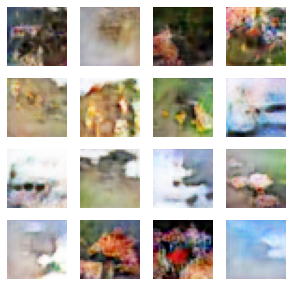

31500: [discriminator loss: 0.663456, acc: 0.609375] [adversarial loss: 1.064268, acc: 0.046875]
31501: [discriminator loss: 0.676990, acc: 0.570312] [adversarial loss: 0.460826, acc: 0.921875]
31502: [discriminator loss: 0.706747, acc: 0.507812] [adversarial loss: 1.093853, acc: 0.093750]
31503: [discriminator loss: 0.754917, acc: 0.531250] [adversarial loss: 0.342932, acc: 1.000000]
31504: [discriminator loss: 0.745741, acc: 0.492188] [adversarial loss: 0.794431, acc: 0.281250]
31505: [discriminator loss: 0.748661, acc: 0.500000] [adversarial loss: 0.441703, acc: 0.953125]
31506: [discriminator loss: 0.779117, acc: 0.437500] [adversarial loss: 0.768877, acc: 0.359375]
31507: [discriminator loss: 0.750697, acc: 0.445312] [adversarial loss: 0.503607, acc: 0.906250]
31508: [discriminator loss: 0.713133, acc: 0.546875] [adversarial loss: 1.056002, acc: 0.062500]
31509: [discriminator loss: 0.696389, acc: 0.539062] [adversarial loss: 0.609409, acc: 0.687500]
31510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


31998: [discriminator loss: 0.706755, acc: 0.500000] [adversarial loss: 0.830432, acc: 0.234375]
31999: [discriminator loss: 0.654403, acc: 0.656250] [adversarial loss: 0.822814, acc: 0.250000]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


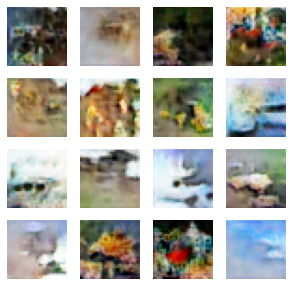

32000: [discriminator loss: 0.655522, acc: 0.656250] [adversarial loss: 1.039335, acc: 0.031250]
32001: [discriminator loss: 0.682005, acc: 0.562500] [adversarial loss: 0.538521, acc: 0.875000]
32002: [discriminator loss: 0.641185, acc: 0.570312] [adversarial loss: 1.117574, acc: 0.046875]
32003: [discriminator loss: 0.697713, acc: 0.570312] [adversarial loss: 0.344630, acc: 0.984375]
32004: [discriminator loss: 0.714817, acc: 0.539062] [adversarial loss: 1.024566, acc: 0.062500]
32005: [discriminator loss: 0.749217, acc: 0.515625] [adversarial loss: 0.409302, acc: 0.953125]
32006: [discriminator loss: 0.797499, acc: 0.476562] [adversarial loss: 0.895555, acc: 0.250000]
32007: [discriminator loss: 0.741845, acc: 0.484375] [adversarial loss: 0.507240, acc: 0.812500]
32008: [discriminator loss: 0.707306, acc: 0.578125] [adversarial loss: 1.155736, acc: 0.000000]
32009: [discriminator loss: 0.709306, acc: 0.539062] [adversarial loss: 0.558072, acc: 0.765625]
32010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


32498: [discriminator loss: 0.725128, acc: 0.492188] [adversarial loss: 0.604151, acc: 0.765625]
32499: [discriminator loss: 0.673579, acc: 0.531250] [adversarial loss: 1.179931, acc: 0.031250]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


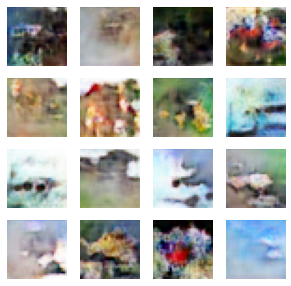

32500: [discriminator loss: 0.653722, acc: 0.531250] [adversarial loss: 0.587465, acc: 0.687500]
32501: [discriminator loss: 0.655666, acc: 0.585938] [adversarial loss: 1.270917, acc: 0.031250]
32502: [discriminator loss: 0.673578, acc: 0.546875] [adversarial loss: 0.356684, acc: 0.984375]
32503: [discriminator loss: 0.723928, acc: 0.476562] [adversarial loss: 0.965407, acc: 0.171875]
32504: [discriminator loss: 0.721563, acc: 0.562500] [adversarial loss: 0.344612, acc: 0.968750]
32505: [discriminator loss: 0.752069, acc: 0.492188] [adversarial loss: 0.841364, acc: 0.281250]
32506: [discriminator loss: 0.782214, acc: 0.476562] [adversarial loss: 0.470622, acc: 0.921875]
32507: [discriminator loss: 0.733271, acc: 0.429688] [adversarial loss: 0.857078, acc: 0.203125]
32508: [discriminator loss: 0.759715, acc: 0.500000] [adversarial loss: 0.579663, acc: 0.843750]
32509: [discriminator loss: 0.755589, acc: 0.460938] [adversarial loss: 1.026787, acc: 0.015625]
32510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


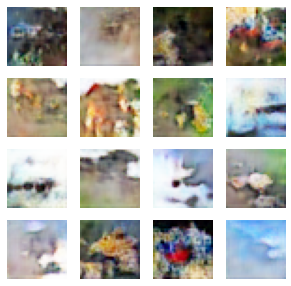

33000: [discriminator loss: 0.708509, acc: 0.507812] [adversarial loss: 0.948376, acc: 0.078125]
33001: [discriminator loss: 0.710717, acc: 0.515625] [adversarial loss: 0.511784, acc: 0.875000]
33002: [discriminator loss: 0.748101, acc: 0.460938] [adversarial loss: 1.237889, acc: 0.015625]
33003: [discriminator loss: 0.709908, acc: 0.562500] [adversarial loss: 0.542423, acc: 0.781250]
33004: [discriminator loss: 0.716418, acc: 0.515625] [adversarial loss: 1.092111, acc: 0.046875]
33005: [discriminator loss: 0.672684, acc: 0.578125] [adversarial loss: 0.647379, acc: 0.625000]
33006: [discriminator loss: 0.651487, acc: 0.593750] [adversarial loss: 0.826357, acc: 0.312500]
33007: [discriminator loss: 0.667415, acc: 0.601562] [adversarial loss: 0.515658, acc: 0.906250]
33008: [discriminator loss: 0.707796, acc: 0.554688] [adversarial loss: 0.622715, acc: 0.687500]
33009: [discriminator loss: 0.745337, acc: 0.507812] [adversarial loss: 0.451053, acc: 0.968750]
33010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


33499: [discriminator loss: 0.640125, acc: 0.656250] [adversarial loss: 0.724601, acc: 0.437500]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


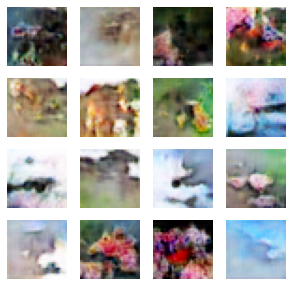

33500: [discriminator loss: 0.691460, acc: 0.554688] [adversarial loss: 0.699531, acc: 0.546875]
33501: [discriminator loss: 0.669669, acc: 0.601562] [adversarial loss: 0.597883, acc: 0.703125]
33502: [discriminator loss: 0.750626, acc: 0.468750] [adversarial loss: 0.600049, acc: 0.734375]
33503: [discriminator loss: 0.744382, acc: 0.398438] [adversarial loss: 0.596747, acc: 0.734375]
33504: [discriminator loss: 0.687680, acc: 0.531250] [adversarial loss: 0.872312, acc: 0.265625]
33505: [discriminator loss: 0.762071, acc: 0.500000] [adversarial loss: 0.483453, acc: 0.937500]
33506: [discriminator loss: 0.737718, acc: 0.507812] [adversarial loss: 1.531226, acc: 0.000000]
33507: [discriminator loss: 0.752266, acc: 0.500000] [adversarial loss: 0.463229, acc: 0.937500]
33508: [discriminator loss: 0.714338, acc: 0.500000] [adversarial loss: 1.305685, acc: 0.015625]
33509: [discriminator loss: 0.683174, acc: 0.617188] [adversarial loss: 0.583682, acc: 0.703125]
33510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


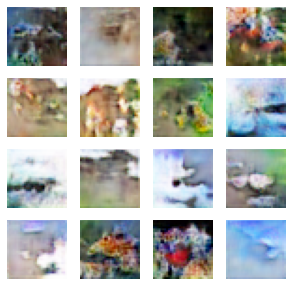

34000: [discriminator loss: 0.734202, acc: 0.531250] [adversarial loss: 0.639377, acc: 0.625000]
34001: [discriminator loss: 0.692451, acc: 0.539062] [adversarial loss: 0.963765, acc: 0.093750]
34002: [discriminator loss: 0.653449, acc: 0.640625] [adversarial loss: 0.674007, acc: 0.609375]
34003: [discriminator loss: 0.596274, acc: 0.765625] [adversarial loss: 1.079195, acc: 0.093750]
34004: [discriminator loss: 0.587421, acc: 0.742188] [adversarial loss: 0.605562, acc: 0.703125]
34005: [discriminator loss: 0.586025, acc: 0.679688] [adversarial loss: 1.166698, acc: 0.046875]
34006: [discriminator loss: 0.669975, acc: 0.601562] [adversarial loss: 0.274276, acc: 1.000000]
34007: [discriminator loss: 0.732561, acc: 0.500000] [adversarial loss: 0.933690, acc: 0.296875]
34008: [discriminator loss: 0.759766, acc: 0.531250] [adversarial loss: 0.292319, acc: 0.984375]
34009: [discriminator loss: 0.874441, acc: 0.476562] [adversarial loss: 0.776016, acc: 0.328125]
34010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


34498: [discriminator loss: 0.664248, acc: 0.609375] [adversarial loss: 0.573856, acc: 0.765625]
34499: [discriminator loss: 0.648632, acc: 0.640625] [adversarial loss: 1.021844, acc: 0.156250]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


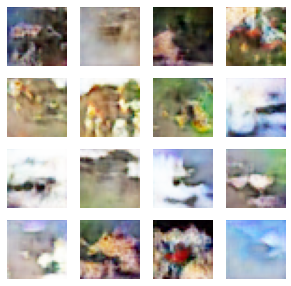

34500: [discriminator loss: 0.619557, acc: 0.632812] [adversarial loss: 0.641632, acc: 0.656250]
34501: [discriminator loss: 0.636453, acc: 0.664062] [adversarial loss: 0.935826, acc: 0.343750]
34502: [discriminator loss: 0.679401, acc: 0.617188] [adversarial loss: 0.384757, acc: 0.953125]
34503: [discriminator loss: 0.722577, acc: 0.492188] [adversarial loss: 1.022795, acc: 0.218750]
34504: [discriminator loss: 0.782177, acc: 0.476562] [adversarial loss: 0.342135, acc: 0.984375]
34505: [discriminator loss: 0.779828, acc: 0.460938] [adversarial loss: 0.864883, acc: 0.281250]
34506: [discriminator loss: 0.818043, acc: 0.476562] [adversarial loss: 0.461910, acc: 0.906250]
34507: [discriminator loss: 0.784080, acc: 0.398438] [adversarial loss: 1.059769, acc: 0.156250]
34508: [discriminator loss: 0.726859, acc: 0.531250] [adversarial loss: 0.669280, acc: 0.484375]
34509: [discriminator loss: 0.705516, acc: 0.515625] [adversarial loss: 1.125565, acc: 0.015625]
34510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


34999: [discriminator loss: 0.726135, acc: 0.562500] [adversarial loss: 0.419956, acc: 0.968750]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


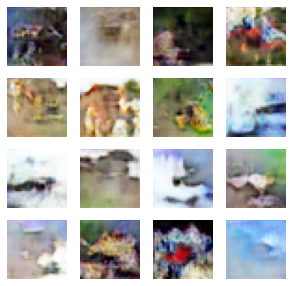

35000: [discriminator loss: 0.770308, acc: 0.523438] [adversarial loss: 1.451147, acc: 0.000000]
35001: [discriminator loss: 0.751215, acc: 0.539062] [adversarial loss: 0.405889, acc: 0.953125]
35002: [discriminator loss: 0.700163, acc: 0.507812] [adversarial loss: 1.139345, acc: 0.031250]
35003: [discriminator loss: 0.689868, acc: 0.570312] [adversarial loss: 0.481960, acc: 0.968750]
35004: [discriminator loss: 0.702071, acc: 0.539062] [adversarial loss: 0.834293, acc: 0.343750]
35005: [discriminator loss: 0.674320, acc: 0.539062] [adversarial loss: 0.559570, acc: 0.796875]
35006: [discriminator loss: 0.724103, acc: 0.507812] [adversarial loss: 0.611318, acc: 0.703125]
35007: [discriminator loss: 0.716635, acc: 0.468750] [adversarial loss: 0.678005, acc: 0.593750]
35008: [discriminator loss: 0.763475, acc: 0.414062] [adversarial loss: 0.678136, acc: 0.546875]
35009: [discriminator loss: 0.755086, acc: 0.429688] [adversarial loss: 0.701259, acc: 0.484375]
35010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

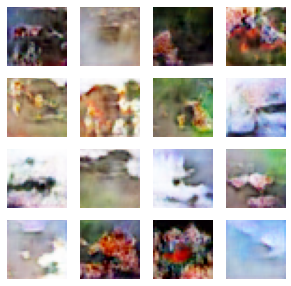

35500: [discriminator loss: 0.782092, acc: 0.492188] [adversarial loss: 0.445955, acc: 0.937500]
35501: [discriminator loss: 0.747754, acc: 0.507812] [adversarial loss: 0.984127, acc: 0.093750]
35502: [discriminator loss: 0.662314, acc: 0.562500] [adversarial loss: 0.685205, acc: 0.578125]
35503: [discriminator loss: 0.630118, acc: 0.695312] [adversarial loss: 1.195307, acc: 0.015625]
35504: [discriminator loss: 0.648870, acc: 0.617188] [adversarial loss: 0.595753, acc: 0.765625]
35505: [discriminator loss: 0.641954, acc: 0.601562] [adversarial loss: 1.211255, acc: 0.046875]
35506: [discriminator loss: 0.681739, acc: 0.617188] [adversarial loss: 0.335432, acc: 0.984375]
35507: [discriminator loss: 0.739733, acc: 0.507812] [adversarial loss: 0.947248, acc: 0.234375]
35508: [discriminator loss: 0.700491, acc: 0.554688] [adversarial loss: 0.427036, acc: 0.921875]
35509: [discriminator loss: 0.742349, acc: 0.484375] [adversarial loss: 0.637013, acc: 0.593750]
35510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


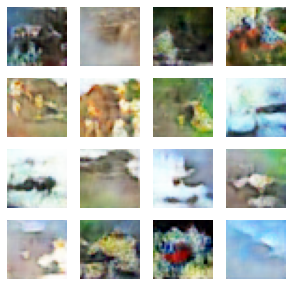

36000: [discriminator loss: 0.692872, acc: 0.593750] [adversarial loss: 0.325385, acc: 0.984375]
36001: [discriminator loss: 0.789760, acc: 0.445312] [adversarial loss: 1.128968, acc: 0.125000]
36002: [discriminator loss: 0.784244, acc: 0.539062] [adversarial loss: 0.427537, acc: 0.953125]
36003: [discriminator loss: 0.732464, acc: 0.453125] [adversarial loss: 1.013914, acc: 0.093750]
36004: [discriminator loss: 0.755406, acc: 0.484375] [adversarial loss: 0.510687, acc: 0.859375]
36005: [discriminator loss: 0.754414, acc: 0.476562] [adversarial loss: 1.277420, acc: 0.015625]
36006: [discriminator loss: 0.697111, acc: 0.546875] [adversarial loss: 0.665671, acc: 0.562500]
36007: [discriminator loss: 0.642969, acc: 0.625000] [adversarial loss: 1.272169, acc: 0.062500]
36008: [discriminator loss: 0.633663, acc: 0.617188] [adversarial loss: 0.420335, acc: 0.953125]
36009: [discriminator loss: 0.703299, acc: 0.554688] [adversarial loss: 1.004748, acc: 0.093750]
36010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

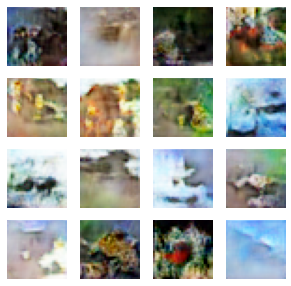

36500: [discriminator loss: 0.606261, acc: 0.695312] [adversarial loss: 0.769560, acc: 0.375000]
36501: [discriminator loss: 0.632040, acc: 0.664062] [adversarial loss: 0.634576, acc: 0.703125]
36502: [discriminator loss: 0.694380, acc: 0.585938] [adversarial loss: 1.005553, acc: 0.187500]
36503: [discriminator loss: 0.736005, acc: 0.546875] [adversarial loss: 0.262683, acc: 1.000000]
36504: [discriminator loss: 0.809691, acc: 0.492188] [adversarial loss: 1.276895, acc: 0.031250]
36505: [discriminator loss: 0.800761, acc: 0.562500] [adversarial loss: 0.418209, acc: 0.921875]
36506: [discriminator loss: 0.699791, acc: 0.562500] [adversarial loss: 1.042957, acc: 0.125000]
36507: [discriminator loss: 0.730348, acc: 0.578125] [adversarial loss: 0.519041, acc: 0.843750]
36508: [discriminator loss: 0.678728, acc: 0.570312] [adversarial loss: 1.148058, acc: 0.031250]
36509: [discriminator loss: 0.702288, acc: 0.570312] [adversarial loss: 0.507031, acc: 0.859375]
36510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


36998: [discriminator loss: 0.645790, acc: 0.593750] [adversarial loss: 1.141330, acc: 0.078125]
36999: [discriminator loss: 0.650081, acc: 0.578125] [adversarial loss: 0.580011, acc: 0.656250]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


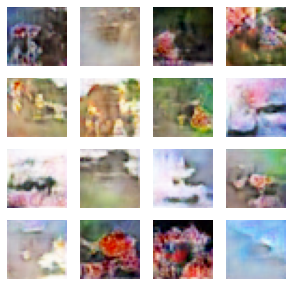

37000: [discriminator loss: 0.661367, acc: 0.593750] [adversarial loss: 1.039547, acc: 0.078125]
37001: [discriminator loss: 0.615425, acc: 0.671875] [adversarial loss: 0.489624, acc: 0.875000]
37002: [discriminator loss: 0.692325, acc: 0.570312] [adversarial loss: 1.033644, acc: 0.140625]
37003: [discriminator loss: 0.722860, acc: 0.546875] [adversarial loss: 0.371079, acc: 0.984375]
37004: [discriminator loss: 0.794192, acc: 0.476562] [adversarial loss: 0.933338, acc: 0.203125]
37005: [discriminator loss: 0.801511, acc: 0.492188] [adversarial loss: 0.346407, acc: 0.984375]
37006: [discriminator loss: 0.760233, acc: 0.445312] [adversarial loss: 0.956834, acc: 0.156250]
37007: [discriminator loss: 0.774546, acc: 0.539062] [adversarial loss: 0.446533, acc: 0.937500]
37008: [discriminator loss: 0.736957, acc: 0.468750] [adversarial loss: 1.191192, acc: 0.031250]
37009: [discriminator loss: 0.694949, acc: 0.546875] [adversarial loss: 0.753974, acc: 0.312500]
37010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


37498: [discriminator loss: 0.647310, acc: 0.625000] [adversarial loss: 0.959856, acc: 0.109375]
37499: [discriminator loss: 0.636422, acc: 0.671875] [adversarial loss: 0.787418, acc: 0.296875]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


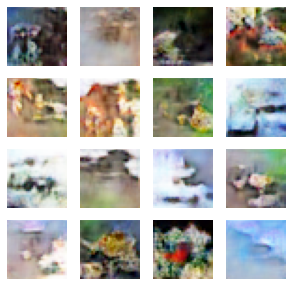

37500: [discriminator loss: 0.607807, acc: 0.703125] [adversarial loss: 0.822643, acc: 0.375000]
37501: [discriminator loss: 0.616609, acc: 0.671875] [adversarial loss: 0.554931, acc: 0.750000]
37502: [discriminator loss: 0.731892, acc: 0.546875] [adversarial loss: 0.714267, acc: 0.500000]
37503: [discriminator loss: 0.658461, acc: 0.585938] [adversarial loss: 0.651886, acc: 0.625000]
37504: [discriminator loss: 0.732207, acc: 0.445312] [adversarial loss: 0.580661, acc: 0.796875]
37505: [discriminator loss: 0.701241, acc: 0.578125] [adversarial loss: 0.902856, acc: 0.234375]
37506: [discriminator loss: 0.761747, acc: 0.515625] [adversarial loss: 0.470346, acc: 0.890625]
37507: [discriminator loss: 0.761967, acc: 0.500000] [adversarial loss: 1.593828, acc: 0.000000]
37508: [discriminator loss: 0.803388, acc: 0.507812] [adversarial loss: 0.458140, acc: 0.953125]
37509: [discriminator loss: 0.728371, acc: 0.484375] [adversarial loss: 1.331875, acc: 0.000000]
37510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


37999: [discriminator loss: 0.597742, acc: 0.742188] [adversarial loss: 0.928985, acc: 0.203125]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


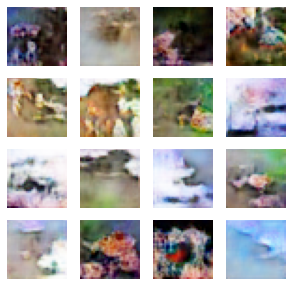

38000: [discriminator loss: 0.627070, acc: 0.640625] [adversarial loss: 0.482462, acc: 0.937500]
38001: [discriminator loss: 0.639809, acc: 0.578125] [adversarial loss: 0.979605, acc: 0.140625]
38002: [discriminator loss: 0.707366, acc: 0.585938] [adversarial loss: 0.392017, acc: 0.906250]
38003: [discriminator loss: 0.733259, acc: 0.546875] [adversarial loss: 1.032007, acc: 0.125000]
38004: [discriminator loss: 0.738968, acc: 0.539062] [adversarial loss: 0.363852, acc: 0.984375]
38005: [discriminator loss: 0.789789, acc: 0.460938] [adversarial loss: 0.865933, acc: 0.234375]
38006: [discriminator loss: 0.753329, acc: 0.484375] [adversarial loss: 0.470927, acc: 0.906250]
38007: [discriminator loss: 0.725008, acc: 0.500000] [adversarial loss: 1.109270, acc: 0.031250]
38008: [discriminator loss: 0.699280, acc: 0.531250] [adversarial loss: 0.546343, acc: 0.796875]
38009: [discriminator loss: 0.698824, acc: 0.554688] [adversarial loss: 1.307835, acc: 0.015625]
38010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


38498: [discriminator loss: 0.680883, acc: 0.578125] [adversarial loss: 0.545625, acc: 0.875000]
38499: [discriminator loss: 0.670117, acc: 0.554688] [adversarial loss: 0.794018, acc: 0.296875]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


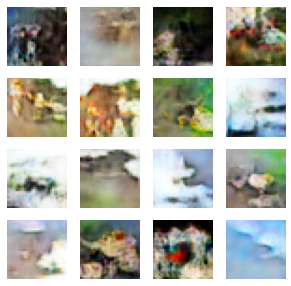

38500: [discriminator loss: 0.684412, acc: 0.570312] [adversarial loss: 0.474766, acc: 0.937500]
38501: [discriminator loss: 0.714925, acc: 0.539062] [adversarial loss: 0.831699, acc: 0.250000]
38502: [discriminator loss: 0.733468, acc: 0.492188] [adversarial loss: 0.490709, acc: 0.953125]
38503: [discriminator loss: 0.723516, acc: 0.507812] [adversarial loss: 1.123468, acc: 0.015625]
38504: [discriminator loss: 0.734317, acc: 0.500000] [adversarial loss: 0.477249, acc: 0.921875]
38505: [discriminator loss: 0.728918, acc: 0.531250] [adversarial loss: 1.274694, acc: 0.000000]
38506: [discriminator loss: 0.734464, acc: 0.531250] [adversarial loss: 0.447675, acc: 0.921875]
38507: [discriminator loss: 0.710796, acc: 0.500000] [adversarial loss: 1.158111, acc: 0.031250]
38508: [discriminator loss: 0.682590, acc: 0.554688] [adversarial loss: 0.466079, acc: 0.968750]
38509: [discriminator loss: 0.747724, acc: 0.476562] [adversarial loss: 1.129302, acc: 0.062500]
38510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


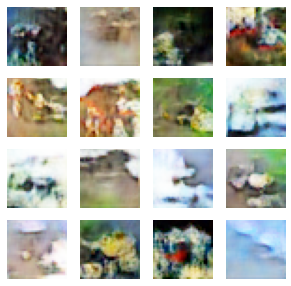

39000: [discriminator loss: 0.759827, acc: 0.500000] [adversarial loss: 1.133471, acc: 0.078125]
39001: [discriminator loss: 0.765213, acc: 0.601562] [adversarial loss: 0.334349, acc: 0.968750]
39002: [discriminator loss: 0.777402, acc: 0.476562] [adversarial loss: 0.914005, acc: 0.187500]
39003: [discriminator loss: 0.754789, acc: 0.500000] [adversarial loss: 0.414209, acc: 0.968750]
39004: [discriminator loss: 0.754240, acc: 0.460938] [adversarial loss: 0.816919, acc: 0.281250]
39005: [discriminator loss: 0.757240, acc: 0.468750] [adversarial loss: 0.551685, acc: 0.859375]
39006: [discriminator loss: 0.754886, acc: 0.421875] [adversarial loss: 0.947644, acc: 0.046875]
39007: [discriminator loss: 0.750038, acc: 0.484375] [adversarial loss: 0.633500, acc: 0.750000]
39008: [discriminator loss: 0.668167, acc: 0.554688] [adversarial loss: 1.221920, acc: 0.015625]
39009: [discriminator loss: 0.680479, acc: 0.562500] [adversarial loss: 0.500677, acc: 0.890625]
39010: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


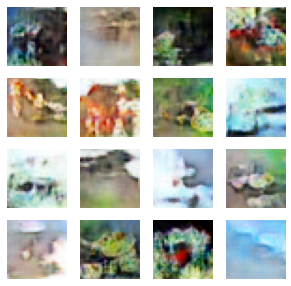

39500: [discriminator loss: 0.689394, acc: 0.562500] [adversarial loss: 0.816657, acc: 0.328125]
39501: [discriminator loss: 0.660610, acc: 0.593750] [adversarial loss: 0.827980, acc: 0.359375]
39502: [discriminator loss: 0.696324, acc: 0.562500] [adversarial loss: 0.707225, acc: 0.484375]
39503: [discriminator loss: 0.727537, acc: 0.476562] [adversarial loss: 0.679714, acc: 0.609375]
39504: [discriminator loss: 0.704421, acc: 0.562500] [adversarial loss: 0.623029, acc: 0.703125]
39505: [discriminator loss: 0.734065, acc: 0.484375] [adversarial loss: 0.827572, acc: 0.250000]
39506: [discriminator loss: 0.710618, acc: 0.554688] [adversarial loss: 0.447221, acc: 0.984375]
39507: [discriminator loss: 0.714236, acc: 0.492188] [adversarial loss: 1.330185, acc: 0.000000]
39508: [discriminator loss: 0.792400, acc: 0.507812] [adversarial loss: 0.380713, acc: 0.984375]
39509: [discriminator loss: 0.758813, acc: 0.500000] [adversarial loss: 1.354498, acc: 0.000000]
39510: [discriminator loss: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


39998: [discriminator loss: 0.715779, acc: 0.500000] [adversarial loss: 0.743939, acc: 0.453125]
39999: [discriminator loss: 0.732227, acc: 0.484375] [adversarial loss: 0.483584, acc: 0.890625]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


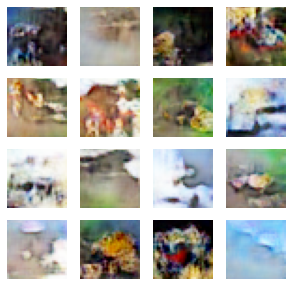

In [7]:
build_and_train_models()

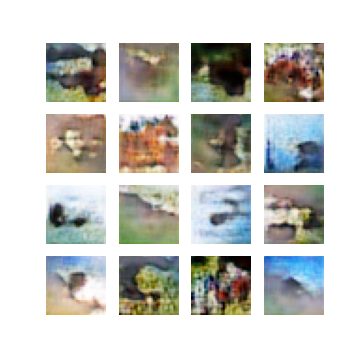

In [10]:
Image.open('/content/dcgan_cifar/07500.png')

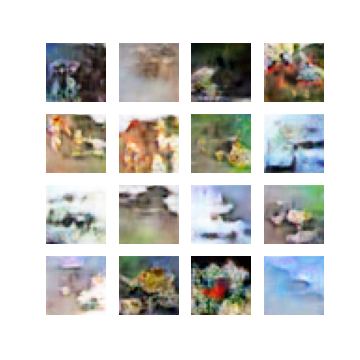

In [11]:
Image.open('/content/dcgan_cifar/37500.png')